
# Week 4 Assignment - Binary Classification (Naive Bayes, Logistic Regression, SVMs)

In this assignment, binary classification and prediction were explored using Naive Bayes, Logistic Regression and Support Vector Machines.  Performance metrics were obtained using a binary confusion matrix and quantities associated with the confusion matrix.  In addition Receiver Operating Curve (ROC), Area Under the Curve (AUC), and Precision/Recall curves were also generated and explored.

(See the SUMMARY/REFLECTION section at the end of this notebook for more detailed summary of the work in this notebook.)

# INGRESS

In [1]:
# import libraries
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import statsmodels.api as sm
import math
import random

from sklearn.model_selection import train_test_split
from matplotlib.pyplot import figure

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.utils import shuffle
 
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import SGDClassifier

from sklearn import metrics
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix

import pylab
from pylab import hist, show, xticks
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from scipy import optimize
from scipy import interpolate
from numpy.linalg import lstsq
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# get training data
from google.colab import files
upload = files.upload()

Saving data.csv to data.csv


In [3]:
origDF = pd.read_csv('data.csv')

In [4]:
# initial inspection of data
pd.set_option('display.max_columns', None)  # display all the columns
origDF.head(10)

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.0,0.458143,0.000725,0.000000,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.0,0.461867,0.000647,0.000000,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025

# EDA

**General inspection of data** -- The inspection below shows all variables are numeric (float or int)

In [5]:
# get general information
origDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [6]:
# check for missing data
pd.set_option('display.max_rows', None)  # display all the results
origDF.isnull().sum()

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
 Realized Sales Gross Margin                                0
 Operating Profit Rate                                      0
 Pre-tax net Interest Rate                                  0
 After-tax net Interest Rate                                0
 Non-industry income and expenditure/revenue                0
 Continuous interest rate (after tax)                       0
 Operating Expense Rate                                     0
 Research and development expense rate                      0
 Cash flow rate                                             0
 Interest-bearing debt interest rate                        0
 Tax rate (A)                                               0
 Net Val

In [7]:
# get basic statistics of each column
origDF.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,1.995347e+09,1.950427e+09,0.467431,1.644801e+07,0.11

In [11]:
origDF[' Net Income Flag'].sum()

6819

**NOTE that 'Net Income Flag' is a column of ones!!!**

In [12]:
# extract the column names
allVariableNames = tuple(origDF.columns)
explanNames = list(allVariableNames[1:])
nExplan = len(explanNames)
print('There are', nExplan, 'explanatory variables')

There are 95 explanatory variables


In [13]:
# Min max scale the explanatory variables

# create Min-Max funcion
def min_max_scale(df):
  mins = df.min()
  maxs = df.max()
  ranges = maxs-mins
  if ranges==0:
    ranges = 1
  return (df - mins)/ranges

# use apply() to min-max all columns except 'Bankrupt?' response variable
origDF_minMax = origDF.copy()
variableList = ['Bankrupt!','Liability Assets Flag','Net Income Flag']
origDF_minMax = origDF_minMax.apply(lambda x: min_max_scale(x) if x.name not in variableList else x)
origDF_minMax.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1.0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.258227e-14,0.000000,0.458143,7.323965e-13,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,5.814497e-12,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,0.498498,3.504580e-14,0.263100,0.363725,8.214412e-13,1.308510e-13,0.629951,2.139429e-12,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,1.862304e-13,3.584136e-13,1.822749e-14,1.166173e-14,0.032903,3.877887e-12,0.392913,3.880387e-12,0.672775,0.166673,0.190643,0.004094,2.263913e-13,1.526798e-14,0.147308,0.334015,0.276920,1.045399e-13,0.676269,0.721275,0.339077,2.682638e-12,0.903225,0.002022,0.064856,7.010000e-02,6.550000e-01,0.593831,0.0458,0.671568,5.098627e-11,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0.0,0.716845,9.388432e-13,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.0,0.016469
1,1.0,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.900751e-14,0.000000,0.461867,6.536007e-13,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,7.001435e-12,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,0.611612,4.748554e-14,0.264516,0.376709,2.187711e-12,4.376345e-13,0.635172,1.257786e-12,0.171176,0.828824,0.005059,0.376760,0.005835,0.09374

In [ ]:
origDF_minMax.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   float64
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

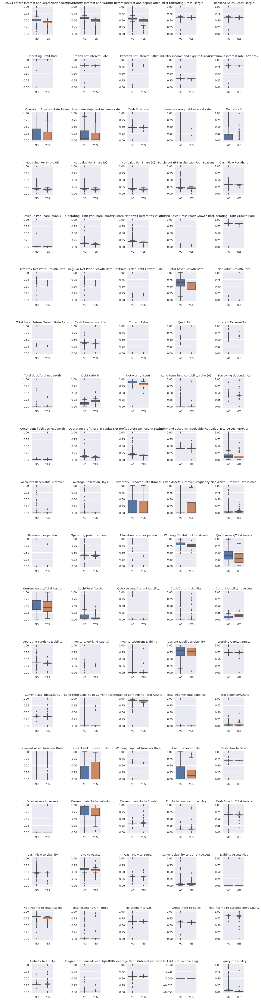

In [ ]:
# generate box plots to view how the distribution of each variable corresponds to bankruptcy (0=NO; 1=YES)

# using Matplotlib subplots with Seaborn boxplots
sns.set() # set seaborn as default style even if use only matplotlib

N_PLT_COLS = 5  # set this value (a divisor of the number of explanatory variables nExplan)
nPltRows = int(nExplan/N_PLT_COLS)

fig, axs = plt.subplots(nrows=nPltRows, ncols=N_PLT_COLS,
                        figsize=(15,60), dpi=80)
fig.tight_layout(pad=6.0)

#sns.set(font_scale = 1)  # reset font scale

rowIndex = 0
colIndex = 0

noDF = origDF_minMax[origDF_minMax['Bankrupt?'] == 0]
yesDF = origDF_minMax[origDF_minMax['Bankrupt?'] != 0]

for aa in range(nExplan):

  explanVariable = explanNames[aa]
  noData = list(noDF[explanVariable])
  yesData = list(yesDF[explanVariable])
  yesAndNoData = [noData, yesData]

  sns.boxplot(ax=axs[rowIndex,colIndex], data=yesAndNoData)
  #axs[rowIndex,colIndex].boxplot(yesAndNoData)
  axs[rowIndex,colIndex].set_xticklabels(['NO', 'YES'])
  axs[rowIndex,colIndex].title.set_text(explanVariable)
 
  # increment column (and possibly row) index
  colIndex += 1
  if colIndex == N_PLT_COLS:
    rowIndex += 1
    colIndex = 0

**Note that boxplots confirm 'Net Income Flag' only possesses 1 value**

In [ ]:
# extract the response variable and explanatory variable columns and
#   remove the constant column 'Net Income Flag'
y = origDF['Bankrupt?']
Xdf = origDF_minMax.copy()
Xdf = Xdf.drop(columns=['Bankrupt?', ' Net Income Flag'])

# revise the list of column names
allVariableNames = tuple(Xdf.columns)
explanNames = list(allVariableNames)
nExplan = len(explanNames)
print('There are now', nExplan, 'explanatory variables')

# create sequence of column numbers to be randomized
columnNumbers = list(range(0,nExplan))

There are now 94 explanatory variables


In [ ]:
#Xdf.info()

In [ ]:
# randomly order the explanatory variables and run Naive Bayes on these smaller
#  subsets of explanatory variables; for each run, record accuracy scores for
#  each explanatory variable and sum them up at the end

from sklearn.naive_bayes import GaussianNB
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score

N_VARS_IN_GROUP = 1  # how many explanatory variables in a subset group
N_ITER = 10000  # do this many iterations (epochs) of the data

# given there are nExplan explanatory variables and that there are N_VARS_IN_GROUP
#  explanatory variables in a group, there will be (nExplan - N_VARS_IN_GROUP + 1) groups
#nGroups = int(nExplan / N_VARS_IN_GROUP)

# extract the explanatory variables in the data to create a set of column names
#    that can be randomized

#### NOTE:  TRAINING AND VALIDATION SUBSETS HAVE NOT YET BEEN CREATED
#    HAVE TO MODIFY THIS CODE
# create storage dataframes for the scores using training set and validation set
#trainScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
#valScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
scoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)


10,000 iterations of randomly-ordered variables with window size (number of variables) = 1

Iteration number = 0
Iteration number = 100
Iteration number = 200
Iteration number = 300
Iteration number = 400
Iteration number = 500
Iteration number = 600
Iteration number = 700
Iteration number = 800
Iteration number = 900
Iteration number = 1000
Iteration number = 1100
Iteration number = 1200
Iteration number = 1300
Iteration number = 1400
Iteration number = 1500
Iteration number = 1600
Iteration number = 1700
Iteration number = 1800
Iteration number = 1900
Iteration number = 2000
Iteration number = 2100
Iteration number = 2200
Iteration number = 2300
Iteration number = 2400
Iteration number = 2500
Iteration number = 2600
Iteration number = 2700
Iteration number = 2800
Iteration number = 2900
Iteration number = 3000
Iteration number = 3100
Iteration number = 3200
Iteration number = 3300
Iteration number = 3400
Iteration number = 3500
Iteration number = 3600
Iteration number = 3700
Iteration number = 3800
Iteration number = 3900
Iteration number = 4000
Iteration number = 4100
Iter

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:78: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:92: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


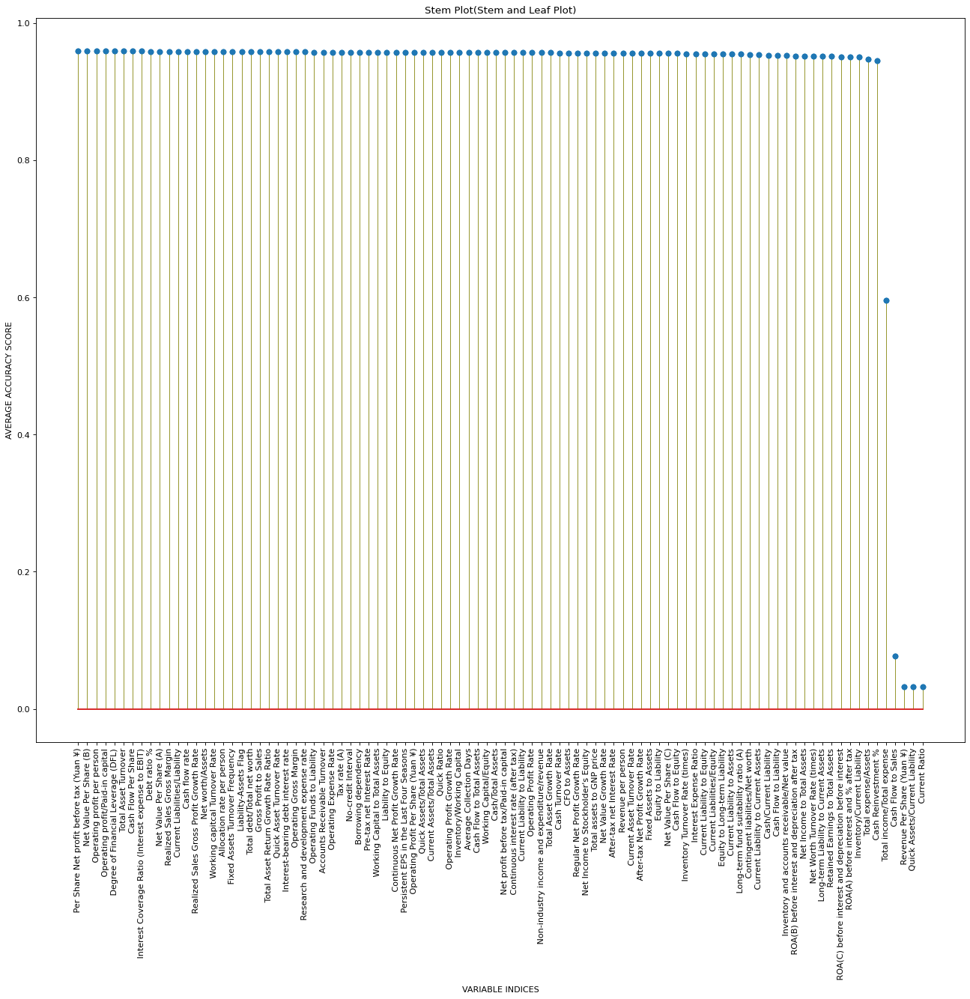

In [ ]:
# go through the epochs
for rowNumber in range(N_ITER):
  
  # use modulo operator to select certain iterations to print status
  if rowNumber % 100 == 0:
    print('Iteration number =', rowNumber)

  firstColIndex = 0
  lastColIndex = firstColIndex + N_VARS_IN_GROUP

  # go through each subset group of explanatory variables
  while lastColIndex < len(Xdf.columns):
    #trainGroupDF = trainDF.iloc[:, firstColIndex:lastColIndex].copy()
    #valGroupDF = valDF.iloc[:, firstColIndex:lastColIndex].copy()
    groupDF = Xdf.iloc[:, firstColIndex:lastColIndex]

    #print('\nCurrent columns being looked at:', groupDF.columns)
    #print('   There are', len(groupDF.columns), 'columns in the group.')

    # perform desired method (e.g., Gaussian Naive Bayes)
    gnb = GaussianNB()
    #trainModel = gnb.fit(trainGroupDF, yTrain)

    gnb.fit(groupDF, y)
    yPredict = gnb.predict(groupDF)
    
    #if np.isnan(yPredict):
    #  yPredict = 0
    #yPredict_train = trainModel.predict(trainGroupDF)
    #yPredict_val = trainModel.predict(valGroupDF)

    # record the mean accuracy scores for the group
    accuracyScore = accuracy_score(y, yPredict)
    #print('   Accuracy score =', accuracyScore)
    #print('Iteration =',rowNumber,'; Score =', accuracyScore)
    #print('First column index =', firstColIndex, '; Last column index =', lastColIndex)
    #trainAccuracyScore = accuracy_score(yTrain, yPredict_train)
    #valAccuracyScore = accuracy_score(yVal, yPredict_val)

    # record the score for all variables in the subset group
    for bb in range(firstColIndex,lastColIndex):
      scoreDF.iat[rowNumber, bb] = accuracyScore
      #trainScoreDF.iloc[rowNumber, cc] = trainAccuracyScore
      #valScoreDF.iloc[rowNumber, cc] = valAccuracyScore

    # shift the indices to the next subset group of explanatory variables
    firstColIndex += 1
    lastColIndex += 1

  # after going thru all subsets and all explanatory variables,
  #   randomize the order of the explanatory variables for the next epoch
  random.shuffle(columnNumbers)
  scoreDF = scoreDF.iloc[:, columnNumbers]
  Xdf = Xdf.iloc[:, columnNumbers]
  #trainScoreDF = trainScoreDF.iloc[:, columnNumbers]
  #valScoreDF = valScoreDF.iloc[:, columnNumbers]
  #trainDF = trainDF.iloc[:, columnNumbers]
  #valDF = valDF.iloc[:, columnNumbers]

# create dataframe of variable scores
scoreTotal = pd.DataFrame()
scoreTotal['Variable'] = scoreDF.columns
scoreTotal['Score'] = list(scoreDF.sum())
sumOfScoresDF = scoreTotal.sort_values(by=['Score'], ascending=False)
sumOfScoresDF = sumOfScoresDF.reset_index(drop=True)

# plot the results
import pylab
from matplotlib.pyplot import figure

figure(figsize=(20, 16), dpi=80)

# plot score results
x = sumOfScoresDF.Variable
y = sumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Stem Plot(Stem and Leaf Plot)')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

10,000 iterations of randomly-ordered variables with window size (number of variables) = 5

Iteration number = 0
Iteration number = 100
Iteration number = 200
Iteration number = 300
Iteration number = 400
Iteration number = 500
Iteration number = 600
Iteration number = 700
Iteration number = 800
Iteration number = 900
Iteration number = 1000
Iteration number = 1100
Iteration number = 1200
Iteration number = 1300
Iteration number = 1400
Iteration number = 1500
Iteration number = 1600
Iteration number = 1700
Iteration number = 1800
Iteration number = 1900
Iteration number = 2000
Iteration number = 2100
Iteration number = 2200
Iteration number = 2300
Iteration number = 2400
Iteration number = 2500
Iteration number = 2600
Iteration number = 2700
Iteration number = 2800
Iteration number = 2900
Iteration number = 3000
Iteration number = 3100
Iteration number = 3200
Iteration number = 3300
Iteration number = 3400
Iteration number = 3500
Iteration number = 3600
Iteration number = 3700
Iteration number = 3800
Iteration number = 3900
Iteration number = 4000
Iteration number = 4100
Iter

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:78: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:92: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


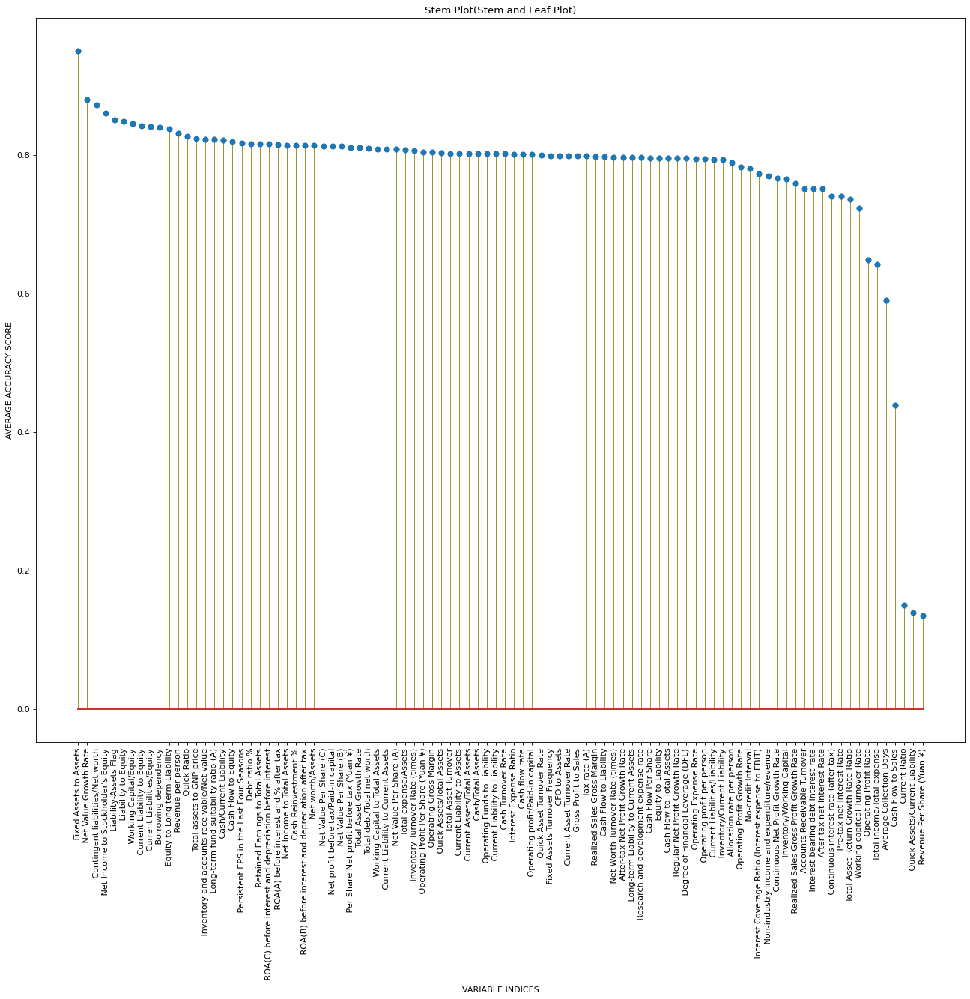

In [ ]:
# go through the epochs
for rowNumber in range(N_ITER):
  
  # use modulo operator to select certain iterations to print status
  if rowNumber % 100 == 0:
    print('Iteration number =', rowNumber)

  firstColIndex = 0
  lastColIndex = firstColIndex + N_VARS_IN_GROUP

  # go through each subset group of explanatory variables
  while lastColIndex < len(Xdf.columns):
    #trainGroupDF = trainDF.iloc[:, firstColIndex:lastColIndex].copy()
    #valGroupDF = valDF.iloc[:, firstColIndex:lastColIndex].copy()
    groupDF = Xdf.iloc[:, firstColIndex:lastColIndex]

    #print('\nCurrent columns being looked at:', groupDF.columns)
    #print('   There are', len(groupDF.columns), 'columns in the group.')

    # perform desired method (e.g., Gaussian Naive Bayes)
    gnb = GaussianNB()
    #trainModel = gnb.fit(trainGroupDF, yTrain)

    gnb.fit(groupDF, y)
    yPredict = gnb.predict(groupDF)
    
    #if np.isnan(yPredict):
    #  yPredict = 0
    #yPredict_train = trainModel.predict(trainGroupDF)
    #yPredict_val = trainModel.predict(valGroupDF)

    # record the mean accuracy scores for the group
    accuracyScore = accuracy_score(y, yPredict)
    #print('   Accuracy score =', accuracyScore)
    #print('Iteration =',rowNumber,'; Score =', accuracyScore)
    #print('First column index =', firstColIndex, '; Last column index =', lastColIndex)
    #trainAccuracyScore = accuracy_score(yTrain, yPredict_train)
    #valAccuracyScore = accuracy_score(yVal, yPredict_val)

    # record the score for all variables in the subset group
    for bb in range(firstColIndex,lastColIndex):
      scoreDF.iat[rowNumber, bb] = accuracyScore
      #trainScoreDF.iloc[rowNumber, cc] = trainAccuracyScore
      #valScoreDF.iloc[rowNumber, cc] = valAccuracyScore

    # shift the indices to the next subset group of explanatory variables
    firstColIndex += 1
    lastColIndex += 1

  # after going thru all subsets and all explanatory variables,
  #   randomize the order of the explanatory variables for the next epoch
  random.shuffle(columnNumbers)
  scoreDF = scoreDF.iloc[:, columnNumbers]
  Xdf = Xdf.iloc[:, columnNumbers]
  #trainScoreDF = trainScoreDF.iloc[:, columnNumbers]
  #valScoreDF = valScoreDF.iloc[:, columnNumbers]
  #trainDF = trainDF.iloc[:, columnNumbers]
  #valDF = valDF.iloc[:, columnNumbers]

# create dataframe of variable scores
scoreTotal = pd.DataFrame()
scoreTotal['Variable'] = scoreDF.columns
scoreTotal['Score'] = list(scoreDF.sum())
sumOfScoresDF = scoreTotal.sort_values(by=['Score'], ascending=False)
sumOfScoresDF = sumOfScoresDF.reset_index(drop=True)

# plot the results
import pylab
from matplotlib.pyplot import figure

figure(figsize=(20, 16), dpi=80)

# plot score results
x = sumOfScoresDF.Variable
y = sumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Stem Plot(Stem and Leaf Plot)')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

(TOP) 10,000 iterations of randomly-ordered variables with window size (number of variables) = 30
(BOTTOM) 1000 iterations with window size = 2

Iteration number = 0
Iteration number = 100
Iteration number = 200
Iteration number = 300
Iteration number = 400
Iteration number = 500
Iteration number = 600
Iteration number = 700
Iteration number = 800
Iteration number = 900
Iteration number = 1000
Iteration number = 1100
Iteration number = 1200
Iteration number = 1300
Iteration number = 1400
Iteration number = 1500
Iteration number = 1600
Iteration number = 1700
Iteration number = 1800
Iteration number = 1900
Iteration number = 2000
Iteration number = 2100
Iteration number = 2200
Iteration number = 2300
Iteration number = 2400
Iteration number = 2500
Iteration number = 2600
Iteration number = 2700
Iteration number = 2800
Iteration number = 2900
Iteration number = 3000
Iteration number = 3100
Iteration number = 3200
Iteration number = 3300
Iteration number = 3400
Iteration number = 3500
Iteration number = 3600
Iteration number = 3700
Iteration number = 3800
Iteration number = 3900
Iteration number = 4000
Iteration number = 4100
Iter

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:78: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:92: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


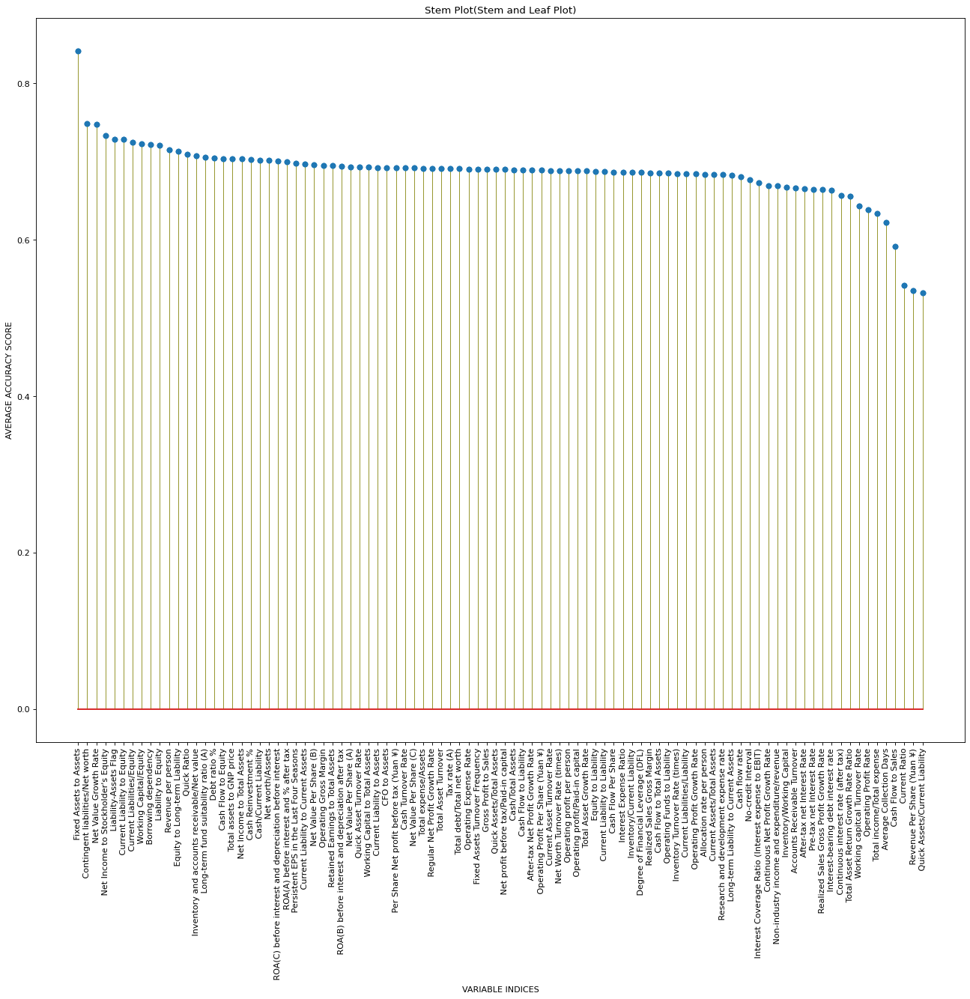

In [ ]:
# go through the epochs
for rowNumber in range(N_ITER):
  
  # use modulo operator to select certain iterations to print status
  if rowNumber % 100 == 0:
    print('Iteration number =', rowNumber)

  firstColIndex = 0
  lastColIndex = firstColIndex + N_VARS_IN_GROUP

  # go through each subset group of explanatory variables
  while lastColIndex < len(Xdf.columns):
    #trainGroupDF = trainDF.iloc[:, firstColIndex:lastColIndex].copy()
    #valGroupDF = valDF.iloc[:, firstColIndex:lastColIndex].copy()
    groupDF = Xdf.iloc[:, firstColIndex:lastColIndex]

    #print('\nCurrent columns being looked at:', groupDF.columns)
    #print('   There are', len(groupDF.columns), 'columns in the group.')

    # perform desired method (e.g., Gaussian Naive Bayes)
    gnb = GaussianNB()
    #trainModel = gnb.fit(trainGroupDF, yTrain)

    gnb.fit(groupDF, y)
    yPredict = gnb.predict(groupDF)
    
    #if np.isnan(yPredict):
    #  yPredict = 0
    #yPredict_train = trainModel.predict(trainGroupDF)
    #yPredict_val = trainModel.predict(valGroupDF)

    # record the mean accuracy scores for the group
    accuracyScore = accuracy_score(y, yPredict)
    #print('   Accuracy score =', accuracyScore)
    #print('Iteration =',rowNumber,'; Score =', accuracyScore)
    #print('First column index =', firstColIndex, '; Last column index =', lastColIndex)
    #trainAccuracyScore = accuracy_score(yTrain, yPredict_train)
    #valAccuracyScore = accuracy_score(yVal, yPredict_val)

    # record the score for all variables in the subset group
    for bb in range(firstColIndex,lastColIndex):
      scoreDF.iat[rowNumber, bb] = accuracyScore
      #trainScoreDF.iloc[rowNumber, cc] = trainAccuracyScore
      #valScoreDF.iloc[rowNumber, cc] = valAccuracyScore

    # shift the indices to the next subset group of explanatory variables
    firstColIndex += 1
    lastColIndex += 1

  # after going thru all subsets and all explanatory variables,
  #   randomize the order of the explanatory variables for the next epoch
  random.shuffle(columnNumbers)
  scoreDF = scoreDF.iloc[:, columnNumbers]
  Xdf = Xdf.iloc[:, columnNumbers]
  #trainScoreDF = trainScoreDF.iloc[:, columnNumbers]
  #valScoreDF = valScoreDF.iloc[:, columnNumbers]
  #trainDF = trainDF.iloc[:, columnNumbers]
  #valDF = valDF.iloc[:, columnNumbers]

# create dataframe of variable scores
scoreTotal = pd.DataFrame()
scoreTotal['Variable'] = scoreDF.columns
scoreTotal['Score'] = list(scoreDF.sum())
sumOfScoresDF = scoreTotal.sort_values(by=['Score'], ascending=False)
sumOfScoresDF = sumOfScoresDF.reset_index(drop=True)

# plot the results
import pylab
from matplotlib.pyplot import figure

figure(figsize=(20, 16), dpi=80)

# plot score results
x = sumOfScoresDF.Variable
y = sumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Stem Plot(Stem and Leaf Plot)')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


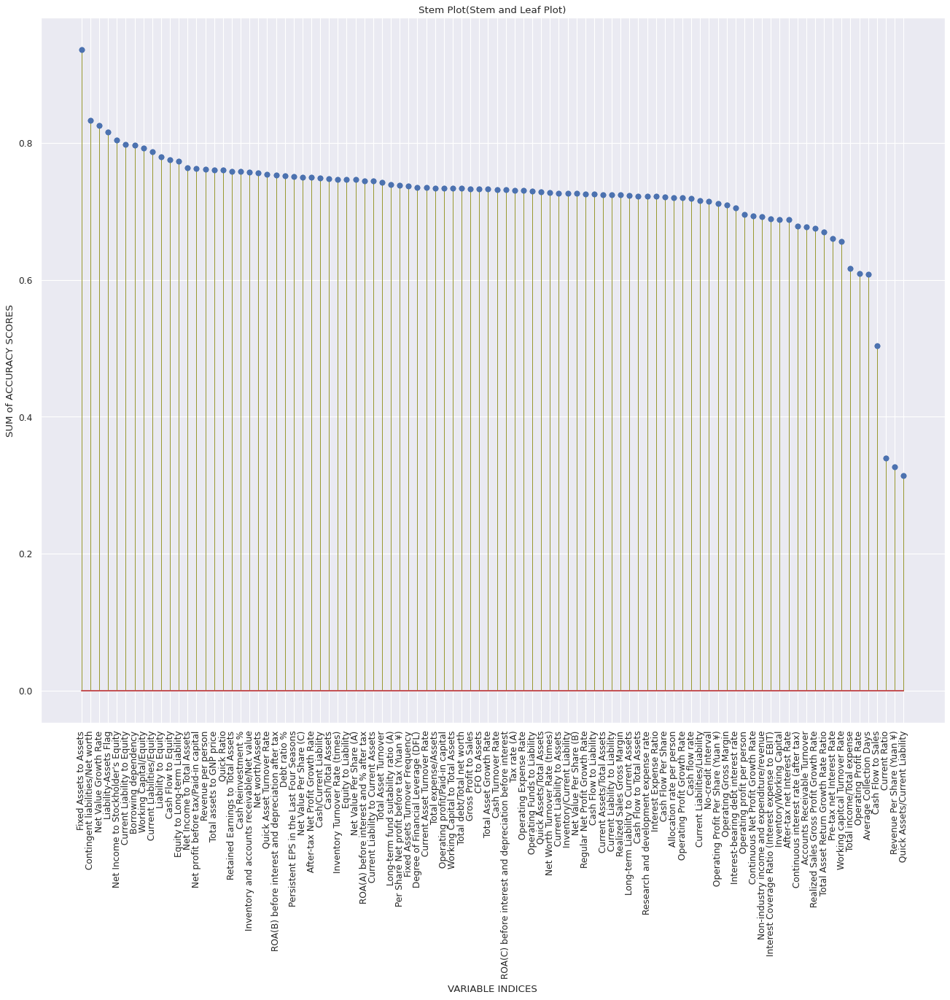

In [ ]:
1000 iterations with window size = 

COMMENT:  Based upon Naive Bayes studies, the following variables appear to be less significant than the others:

LEAST SIGNIFICANT:  Quick Assets/Currently Liability; Revenue Per Share (Yuan ¥); Current Ratio

2nd LEAST SIGNIFICANT: Cash Flow to Sales

3rd LEAST SIGNIFICANT:  Total income / Total expense

Remove these variables and repeat Naive Bayes with window size = 3

In [ ]:
# extract the response variable and explanatory variable columns and
#   remove the constant column 'Net Income Flag'
y = origDF['Bankrupt?']
Xdf = origDF_minMax.copy()
Xdf = Xdf.drop(columns=['Bankrupt?', ' Net Income Flag'])

Xdf.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.258227e-14,0.000000,0.458143,7.323965e-13,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,5.814497e-12,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,0.498498,3.504580e-14,0.263100,0.363725,8.214412e-13,1.308510e-13,0.629951,2.139429e-12,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,1.862304e-13,3.584136e-13,1.822749e-14,1.166173e-14,0.032903,3.877887e-12,0.392913,3.880387e-12,0.672775,0.166673,0.190643,0.004094,2.263913e-13,1.526798e-14,0.147308,0.334015,0.276920,1.045399e-13,0.676269,0.721275,0.339077,2.682638e-12,0.903225,0.002022,0.064856,7.010000e-02,6.550000e-01,0.593831,0.0458,0.671568,5.098627e-11,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0.0,0.716845,9.388432e-13,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.900751e-14,0.000000,0.461867,6.536007e-13,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,7.001435e-12,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,0.611612,4.748554e-14,0.264516,0.376709,2.187711e-12,4.376345e-13,0.635172,1.257786e-12,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,1.320694e

In [ ]:
# extract the response variable and explanatory variable columns and
#   remove the constant column 'Net Income Flag'
y = origDF['Bankrupt?']
Xdf = origDF_minMax.copy()
Xdf = Xdf.drop(columns=['Bankrupt?', ' Net Income Flag'])

# remove the other columns specified above and re-run Naive Bayes
print('The number of columns in Xdf is', len(Xdf.columns))
Xdf_reduced = Xdf.copy()
Xdf_reduced = Xdf_reduced.drop([' Quick Assets/Current Liability',
                                     ' Revenue Per Share (Yuan ¥)',
                                     ' Current Ratio',' Cash Flow to Sales',
                                     ' Total income/Total expense'], axis=1)

# revise the list of column names
allVariableNames = tuple(Xdf_reduced.columns)
explanNames = list(allVariableNames)
nExplan = len(explanNames)
print('There are now', nExplan, 'explanatory variables')

# create sequence of column numbers to be randomized
columnNumbers = list(range(0,nExplan))

Xdf_reduced.head()

The number of columns in Xdf is 94
There are now 89 explanatory variables


,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.258227e-14,0.000000,0.458143,7.323965e-13,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,0.498498,3.504580e-14,0.263100,0.363725,1.308510e-13,0.629951,2.139429e-12,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,1.862304e-13,3.584136e-13,1.822749e-14,1.166173e-14,0.032903,3.877887e-12,0.392913,3.880387e-12,0.672775,0.166673,0.190643,0.004094,1.526798e-14,0.147308,0.334015,0.276920,1.045399e-13,0.676269,0.721275,0.339077,2.682638e-12,0.903225,0.064856,7.010000e-02,6.550000e-01,0.593831,0.0458,5.098627e-11,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0.0,0.716845,9.388432e-13,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.900751e-14,0.000000,0.461867,6.536007e-13,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,0.611612,4.748554e-14,0.264516,0.376709,4.376345e-13,0.635172,1.257786e-12,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,1.320694e-13,5.053246e-13,9.369369e-01,7.197197e-02,0.025484,7.819127e-13,0.391590,1.288921e-12,0.751111,0.127236,0.182419,0.014948,1.434104e-13,0.056963,0.341106,0.289642,5.256995e-13,0.308589,0.731975,0.32974

Iteration number = 0
Iteration number = 100
Iteration number = 200
Iteration number = 300
Iteration number = 400
Iteration number = 500
Iteration number = 600
Iteration number = 700
Iteration number = 800
Iteration number = 900
Iteration number = 1000
Iteration number = 1100
Iteration number = 1200
Iteration number = 1300
Iteration number = 1400
Iteration number = 1500
Iteration number = 1600
Iteration number = 1700
Iteration number = 1800
Iteration number = 1900
Iteration number = 2000
Iteration number = 2100
Iteration number = 2200
Iteration number = 2300
Iteration number = 2400
Iteration number = 2500
Iteration number = 2600
Iteration number = 2700
Iteration number = 2800
Iteration number = 2900
Iteration number = 3000
Iteration number = 3100
Iteration number = 3200
Iteration number = 3300
Iteration number = 3400
Iteration number = 3500
Iteration number = 3600
Iteration number = 3700
Iteration number = 3800
Iteration number = 3900
Iteration number = 4000
Iteration number = 4100
Iter

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:98: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


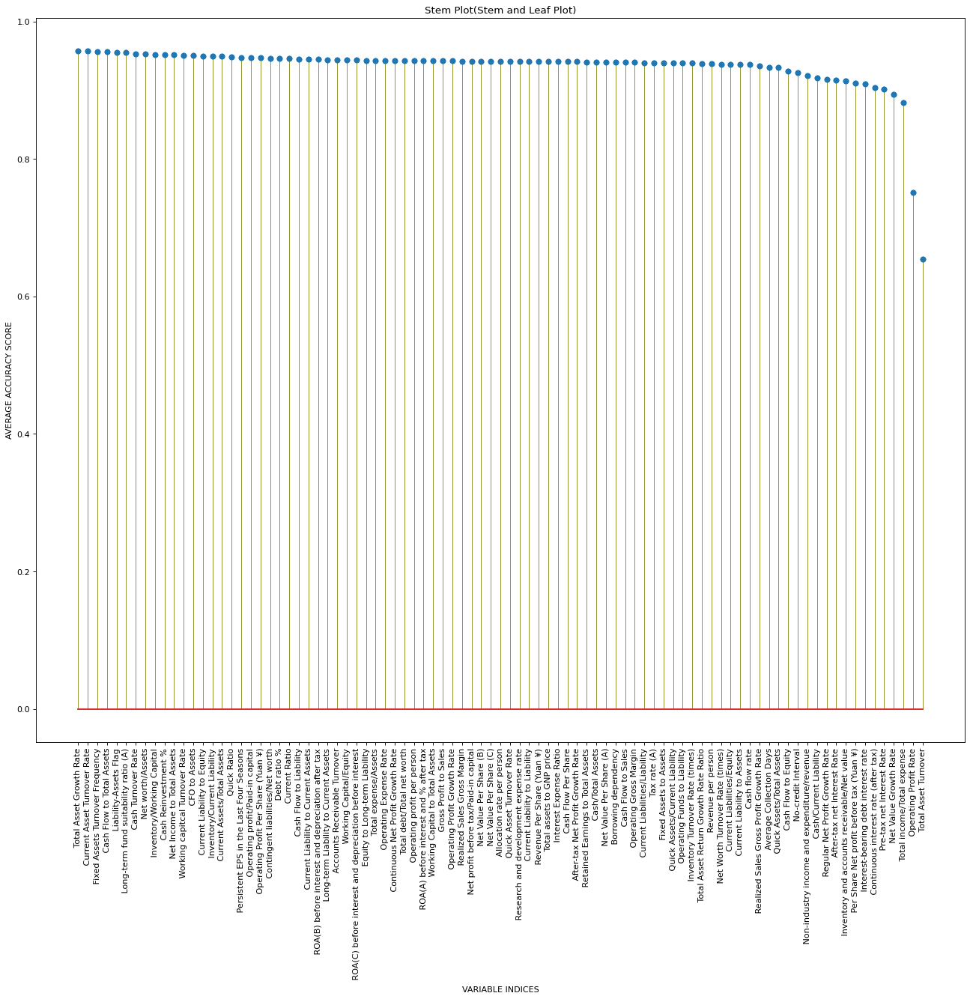

In [ ]:
# randomly order the explanatory variables and run Naive Bayes on these smaller
#  subsets of explanatory variables; for each run, record accuracy scores for
#  each explanatory variable and sum them up at the end

from sklearn.naive_bayes import GaussianNB
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score

N_VARS_IN_GROUP = 3  # how many explanatory variables in a subset group
N_ITER = 10000  # do this many iterations (epochs) of the data

scoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)

# go through the epochs
for rowNumber in range(N_ITER):
  
  # use modulo operator to select certain iterations to print status
  if rowNumber % 100 == 0:
    print('Iteration number =', rowNumber)

  firstColIndex = 0
  lastColIndex = firstColIndex + N_VARS_IN_GROUP

  # go through each subset group of explanatory variables
  while lastColIndex < len(Xdf_reduced.columns):
    #trainGroupDF = trainDF.iloc[:, firstColIndex:lastColIndex].copy()
    #valGroupDF = valDF.iloc[:, firstColIndex:lastColIndex].copy()
    groupDF = Xdf_reduced.iloc[:, firstColIndex:lastColIndex]

    #print('\nCurrent columns being looked at:', groupDF.columns)
    #print('   There are', len(groupDF.columns), 'columns in the group.')

    # perform desired method (e.g., Gaussian Naive Bayes)
    gnb = GaussianNB()
    #trainModel = gnb.fit(trainGroupDF, yTrain)

    gnb.fit(groupDF, y)
    yPredict = gnb.predict(groupDF)
    
    #if np.isnan(yPredict):
    #  yPredict = 0
    #yPredict_train = trainModel.predict(trainGroupDF)
    #yPredict_val = trainModel.predict(valGroupDF)

    # record the mean accuracy scores for the group
    accuracyScore = accuracy_score(y, yPredict)
    #print('   Accuracy score =', accuracyScore)
    #print('Iteration =',rowNumber,'; Score =', accuracyScore)
    #print('First column index =', firstColIndex, '; Last column index =', lastColIndex)
    #trainAccuracyScore = accuracy_score(yTrain, yPredict_train)
    #valAccuracyScore = accuracy_score(yVal, yPredict_val)

    # record the score for all variables in the subset group
    for bb in range(firstColIndex,lastColIndex):
      scoreDF.iat[rowNumber, bb] = accuracyScore
      #trainScoreDF.iloc[rowNumber, cc] = trainAccuracyScore
      #valScoreDF.iloc[rowNumber, cc] = valAccuracyScore

    # shift the indices to the next subset group of explanatory variables
    firstColIndex += 1
    lastColIndex += 1

  # after going thru all subsets and all explanatory variables,
  #   randomize the order of the explanatory variables for the next epoch
  random.shuffle(columnNumbers)
  scoreDF = scoreDF.iloc[:, columnNumbers]
  Xdf_reduced = Xdf_reduced.iloc[:, columnNumbers]
  #trainScoreDF = trainScoreDF.iloc[:, columnNumbers]
  #valScoreDF = valScoreDF.iloc[:, columnNumbers]
  #trainDF = trainDF.iloc[:, columnNumbers]
  #valDF = valDF.iloc[:, columnNumbers]

# create dataframe of variable scores
scoreTotal = pd.DataFrame()
scoreTotal['Variable'] = scoreDF.columns
scoreTotal['Score'] = list(scoreDF.sum())
sumOfScoresDF = scoreTotal.sort_values(by=['Score'], ascending=False)
sumOfScoresDF = sumOfScoresDF.reset_index(drop=True)

# plot the results
import pylab
from matplotlib.pyplot import figure

figure(figsize=(20, 16), dpi=80)

# plot score results
x = sumOfScoresDF.Variable
y = sumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Stem Plot(Stem and Leaf Plot)')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

Drop 'Total Asset Turnover' and 'Operating Profit Rate'

In [ ]:
# extract the response variable and explanatory variable columns and
#   remove the constant column 'Net Income Flag'
y = origDF['Bankrupt?']
Xdf = origDF_minMax.copy()
Xdf = Xdf.drop(columns=['Bankrupt?', ' Net Income Flag'])

# remove the other columns specified above and re-run Naive Bayes
print('The number of columns in Xdf is', len(Xdf.columns))
Xdf_reduced = Xdf.copy()
Xdf_reduced = Xdf_reduced.drop([' Quick Assets/Current Liability',
                                     ' Revenue Per Share (Yuan ¥)',
                                     ' Current Ratio',' Cash Flow to Sales',
                                     ' Total income/Total expense'], axis=1)

print('The number of columns in Xdf_reduced is', len(Xdf_reduced.columns))
Xdf_reducedA = Xdf_reduced.copy()
Xdf_reducedA = Xdf_reducedA.drop([' Total Asset Turnover', ' Operating Profit Rate'], axis=1)
print('The number of columns in Xdf_reducedA is', len(Xdf_reducedA.columns))

# revise the list of column names
allVariableNames = tuple(Xdf_reducedA.columns)
explanNames = list(allVariableNames)
nExplan = len(explanNames)
print('In other words, there are now', nExplan, 'explanatory variables')

# create sequence of column numbers to be randomized
columnNumbers = list(range(0,nExplan))

Xdf_reducedA.head()

The number of columns in Xdf is 94
The number of columns in Xdf_reduced is 89
The number of columns in Xdf_reducedA is 87
In other words, there are now 87 explanatory variables


,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.796887,0.808809,0.302646,0.780985,1.258227e-14,0.000000,0.458143,7.323965e-13,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,0.498498,3.504580e-14,0.263100,0.363725,1.308510e-13,0.629951,2.139429e-12,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,1.862304e-13,3.584136e-13,1.822749e-14,1.166173e-14,0.032903,3.877887e-12,0.392913,3.880387e-12,0.672775,0.166673,0.190643,0.004094,1.526798e-14,0.147308,0.334015,0.276920,1.045399e-13,0.676269,0.721275,0.339077,2.682638e-12,0.903225,0.064856,7.010000e-02,6.550000e-01,0.593831,0.0458,5.098627e-11,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0.0,0.716845,9.388432e-13,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.797380,0.809301,0.303556,0.781506,2.900751e-14,0.000000,0.461867,6.536007e-13,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,0.611612,4.748554e-14,0.264516,0.376709,4.376345e-13,0.635172,1.257786e-12,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,1.320694e-13,5.053246e-13,9.369369e-01,7.197197e-02,0.025484,7.819127e-13,0.391590,1.288921e-12,0.751111,0.127236,0.182419,0.014948,1.434104e-13,0.056963,0.341106,0.289642,5.256995e-13,0.308589,0.731975,0.329740,2.510149e-12,0.931065,0.025516,1.065198e-14,7.700000e-01,0.593916,0.2490,5.63

**Split into training and validation sets and repeat Naive Bayes**

In [ ]:
# split into training and validation datasets
from sklearn.model_selection import train_test_split
y = origDF['Bankrupt?']
X = Xdf_reducedA.iloc[: , 1:len(Xdf_reducedA.columns)]

trainDF, valDF, yTrain, yVal = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [ ]:
# create sequence of column numbers to be randomized
columnNumbers = list(range(0, len(trainDF.columns)))
columnNumbersVal = list(range(0, len(valDF.columns)))
if columnNumbersVal == columnNumbers:
  print('Column numbers A-OK!')
else:
  print('UH-OH, COLUMN NUMBERS DO NOT MATCH !!!\n')
  valDF = valDF.iloc[:, columnNumbers]


Column numbers A-OK!


In [ ]:
trainDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5455 entries, 3759 to 860
Data columns (total 86 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0    ROA(A) before interest and % after tax              5455 non-null   float64
 1    ROA(B) before interest and depreciation after tax   5455 non-null   float64
 2    Operating Gross Margin                              5455 non-null   float64
 3    Realized Sales Gross Margin                         5455 non-null   float64
 4    Pre-tax net Interest Rate                           5455 non-null   float64
 5    After-tax net Interest Rate                         5455 non-null   float64
 6    Non-industry income and expenditure/revenue         5455 non-null   float64
 7    Continuous interest rate (after tax)                5455 non-null   float64
 8    Operating Expense Rate                              5455 non-null

In [ ]:
valDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1364 entries, 239 to 6423
Data columns (total 86 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0    ROA(A) before interest and % after tax              1364 non-null   float64
 1    ROA(B) before interest and depreciation after tax   1364 non-null   float64
 2    Operating Gross Margin                              1364 non-null   float64
 3    Realized Sales Gross Margin                         1364 non-null   float64
 4    Pre-tax net Interest Rate                           1364 non-null   float64
 5    After-tax net Interest Rate                         1364 non-null   float64
 6    Non-industry income and expenditure/revenue         1364 non-null   float64
 7    Continuous interest rate (after tax)                1364 non-null   float64
 8    Operating Expense Rate                              1364 non-null

In [ ]:
# randomly order the explanatory variables and run Naive Bayes on these smaller
#  subsets of explanatory variables; for each run, record accuracy scores for
#  each explanatory variable and sum them up at the end

from sklearn.naive_bayes import GaussianNB
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score

N_VARS_IN_GROUP = 5  # how many explanatory variables in a subset group
N_ITER = 10000  # do this many iterations (epochs) of the data

#scoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
trainScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
valScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)

# go through the epochs
for rowNumber in range(N_ITER):
  
  # use modulo operator to select certain iterations to print status
  if rowNumber % 500 == 0:
    print('Iteration number =', rowNumber)

  firstColIndex = 0
  lastColIndex = firstColIndex + N_VARS_IN_GROUP

  #--------------------------------------------------------------
  # go through each subset group of explanatory variables
  while lastColIndex < len(Xdf_reducedA.columns):

    trainGroupDF = trainDF.iloc[:, firstColIndex:lastColIndex]
    valGroupDF = valDF.iloc[:, firstColIndex:lastColIndex]

    #print('\nCurrent columns being looked at:', groupDF.columns)
    #print('   There are', len(groupDF.columns), 'columns in the group.')

    # perform desired method (e.g., Gaussian Naive Bayes)
    gnb = GaussianNB()
    gnb.fit(trainGroupDF, yTrain)

    #gnb.fit(groupDF, y)
    #yPredict = gnb.predict(groupDF)
    
    #if np.isnan(yPredict):
    #  yPredict = 0
    yPredict_train = gnb.predict(trainGroupDF)
    yPredict_val = gnb.predict(valGroupDF)

    # record the accuracy scores for the group
    #accuracyScore = accuracy_score(y, yPredict)
    #print('   Accuracy score =', accuracyScore)
    #print('Iteration =',rowNumber,'; Score =', accuracyScore)
    #print('First column index =', firstColIndex, '; Last column index =', lastColIndex)
    trainAccuracyScore = accuracy_score(yTrain, yPredict_train)
    valAccuracyScore = accuracy_score(yVal, yPredict_val)

    # record the score for all variables in the subset group
    for bb in range(firstColIndex,lastColIndex):
      #scoreDF.iat[rowNumber, bb] = accuracyScore
      trainScoreDF.iat[rowNumber, bb] = trainAccuracyScore
      valScoreDF.iat[rowNumber, bb] = valAccuracyScore

    # shift the indices to the next subset group of explanatory variables
    firstColIndex += 1
    lastColIndex += 1

  # after going thru all subsets and all explanatory variables,
  #   randomize the order of the explanatory variables for the next epoch
  random.shuffle(columnNumbers)

  #Xdf_reducedA = Xdf_reducedA.iloc[:, columnNumbers]

  trainScoreDF = trainScoreDF.iloc[:, columnNumbers]
  valScoreDF = valScoreDF.iloc[:, columnNumbers]
  trainDF = trainDF.iloc[:, columnNumbers]
  valDF = valDF.iloc[:, columnNumbers]

Iteration number = 0
Iteration number = 100
Iteration number = 200
Iteration number = 300
Iteration number = 400
Iteration number = 500
Iteration number = 600
Iteration number = 700
Iteration number = 800
Iteration number = 900
Iteration number = 1000
Iteration number = 1100
Iteration number = 1200
Iteration number = 1300
Iteration number = 1400
Iteration number = 1500
Iteration number = 1600
Iteration number = 1700
Iteration number = 1800
Iteration number = 1900
Iteration number = 2000
Iteration number = 2100
Iteration number = 2200
Iteration number = 2300
Iteration number = 2400
Iteration number = 2500
Iteration number = 2600
Iteration number = 2700
Iteration number = 2800
Iteration number = 2900
Iteration number = 3000
Iteration number = 3100
Iteration number = 3200
Iteration number = 3300
Iteration number = 3400
Iteration number = 3500
Iteration number = 3600
Iteration number = 3700
Iteration number = 3800
Iteration number = 3900
Iteration number = 4000
Iteration number = 4100
Iter

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


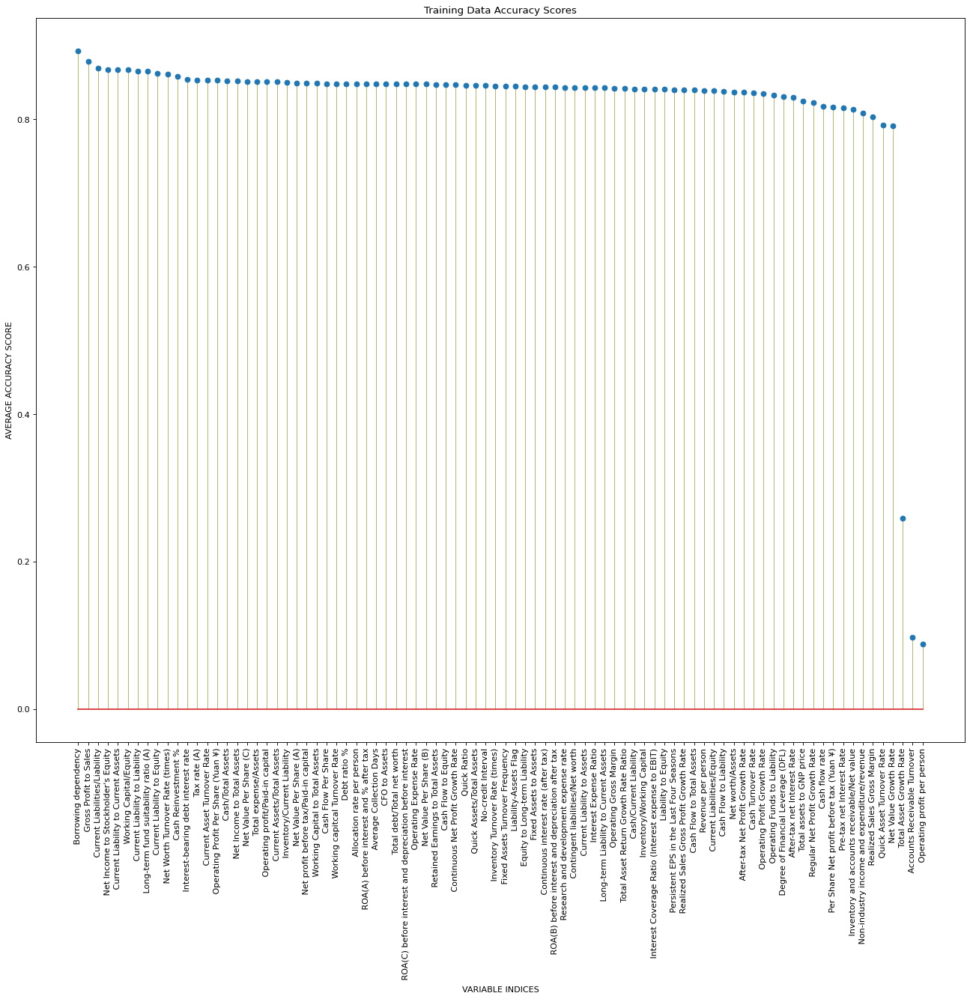

In [ ]:
# plot the accuracy results for the training data
import pylab
from matplotlib.pyplot import figure

# create dataframe of train data variable scores
trainScoreTotal = pd.DataFrame()
trainScoreTotal['Variable'] = trainScoreDF.columns
trainScoreTotal['Score'] = list(trainScoreDF.sum())
trainSumOfScoresDF = trainScoreTotal.sort_values(by=['Score'], ascending=False)
trainSumOfScoresDF = trainSumOfScoresDF.reset_index(drop=True)

figure(figsize=(20, 16), dpi=80)

# plot training data score results
x = trainSumOfScoresDF.Variable
y = trainSumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Training Data Accuracy Scores')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


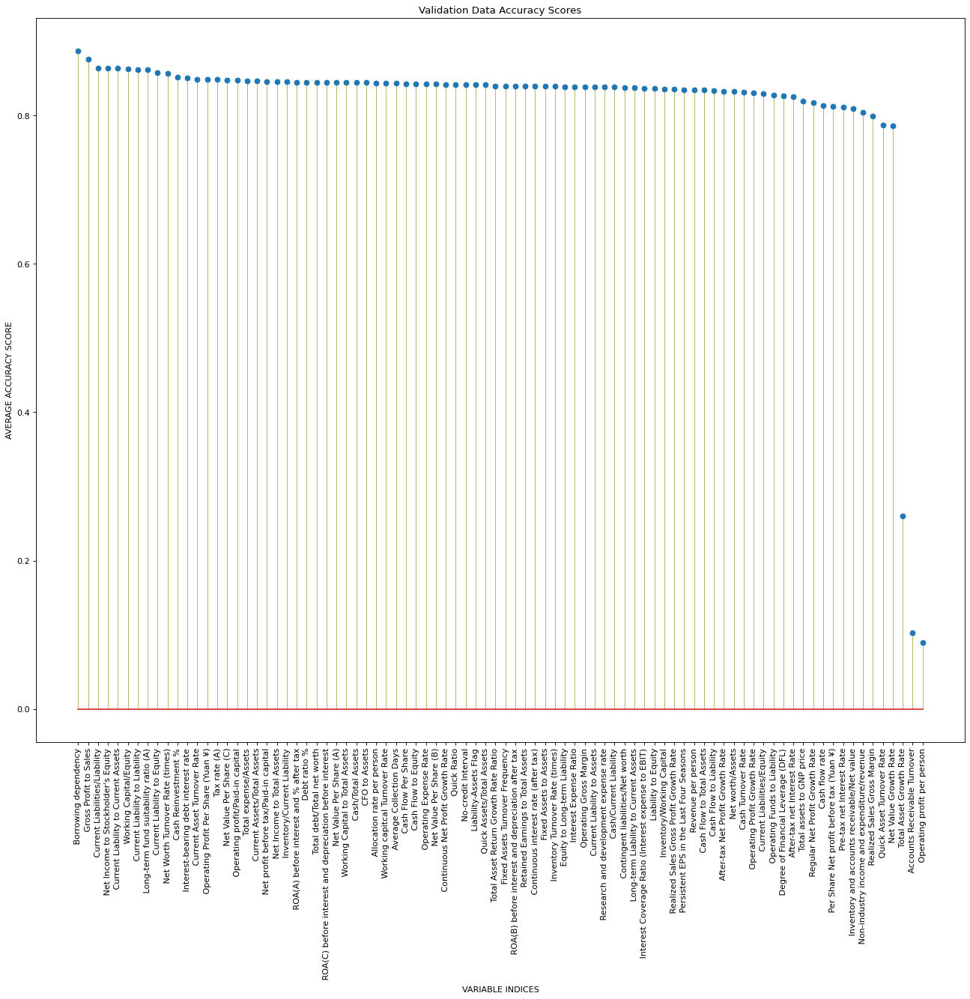

In [ ]:
# plot the accuracy results for the validation data
import pylab
from matplotlib.pyplot import figure

# create dataframe of validation data variable scores
valScoreTotal = pd.DataFrame()
valScoreTotal['Variable'] = valScoreDF.columns
valScoreTotal['Score'] = list(valScoreDF.sum())
valSumOfScoresDF = valScoreTotal.sort_values(by=['Score'], ascending=False)
valSumOfScoresDF = valSumOfScoresDF.reset_index(drop=True)

figure(figsize=(20, 16), dpi=80)

# plot validation data score results
x = valSumOfScoresDF.Variable
y = valSumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Validation Data Accuracy Scores')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

Based upon the latest Naive Bayes information above, 'Operating profit per person', 'Accounts Receivable Turnover', and 'Total Asset Growth Rate' do not appear to be as significant as the other variables.

In [ ]:
Xdf_reducedB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 87 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 1    ROA(A) before interest and % after tax                   6819 non-null   float64
 2    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 3    Operating Gross Margin                                   6819 non-null   float64
 4    Realized Sales Gross Margin                              6819 non-null   float64
 5    Pre-tax net Interest Rate                                6819 non-null   float64
 6    After-tax net Interest Rate                              6819 non-null   float64
 7    Non-industry income and expenditure/revenue              6819 non-null   float64
 8    Continuous intere

In [ ]:
# extract the response variable and explanatory variable columns and
#   remove the constant column 'Net Income Flag'
y = origDF['Bankrupt?']
Xdf = origDF_minMax.copy()
Xdf = Xdf.drop(columns=['Bankrupt?', ' Net Income Flag'])

# remove the other columns specified above and re-run Naive Bayes
print('The number of columns in Xdf is', len(Xdf.columns))
Xdf_reduced = Xdf.copy()
Xdf_reduced = Xdf_reduced.drop([' Quick Assets/Current Liability',
                                     ' Revenue Per Share (Yuan ¥)',
                                     ' Current Ratio',' Cash Flow to Sales',
                                     ' Total income/Total expense'], axis=1)

print('The number of columns in Xdf_reduced is', len(Xdf_reduced.columns))
Xdf_reducedA = Xdf_reduced.copy()
Xdf_reducedA = Xdf_reducedA.drop([' Total Asset Turnover', ' Operating Profit Rate'], axis=1)
print('The number of columns in Xdf_reducedA is', len(Xdf_reducedA.columns))
Xdf_reducedB = Xdf_reducedA.copy()
Xdf_reducedB = Xdf_reducedB.drop([' Operating profit per person', ' Accounts Receivable Turnover', ' Total Asset Growth Rate'], axis=1)
print('The number of columns in Xdf_reducedB is', len(Xdf_reducedB.columns))

# revise the list of column names
allVariableNames = tuple(Xdf_reducedB.columns)
explanNames = list(allVariableNames)
nExplan = len(explanNames)
print('In other words, there are now', nExplan, 'explanatory variables')

# create sequence of column numbers to be randomized
columnNumbers = list(range(0,nExplan))

The number of columns in Xdf is 94
The number of columns in Xdf_reduced is 89
The number of columns in Xdf_reducedA is 87
The number of columns in Xdf_reducedB is 84
In other words, there are now 84 explanatory variables


In [ ]:
# split into training and validation datasets
from sklearn.model_selection import train_test_split
y = origDF['Bankrupt?']
X = Xdf_reducedB.copy()

trainDF, valDF, yTrain, yVal = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [ ]:
# create sequence of column numbers to be randomized
columnNumbers = list(range(0, len(trainDF.columns)))
columnNumbersVal = list(range(0, len(valDF.columns)))
if columnNumbersVal == columnNumbers:
  print('Column numbers A-OK!')
  print('There are', len(columnNumbers), 'columns !!!')
else:
  print('UH-OH, COLUMN NUMBERS DO NOT MATCH !!!\n')
  valDF = valDF.iloc[:, columnNumbers]

Column numbers A-OK!
There are 84 columns !!!


Iteration number = 0
Iteration number = 500


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


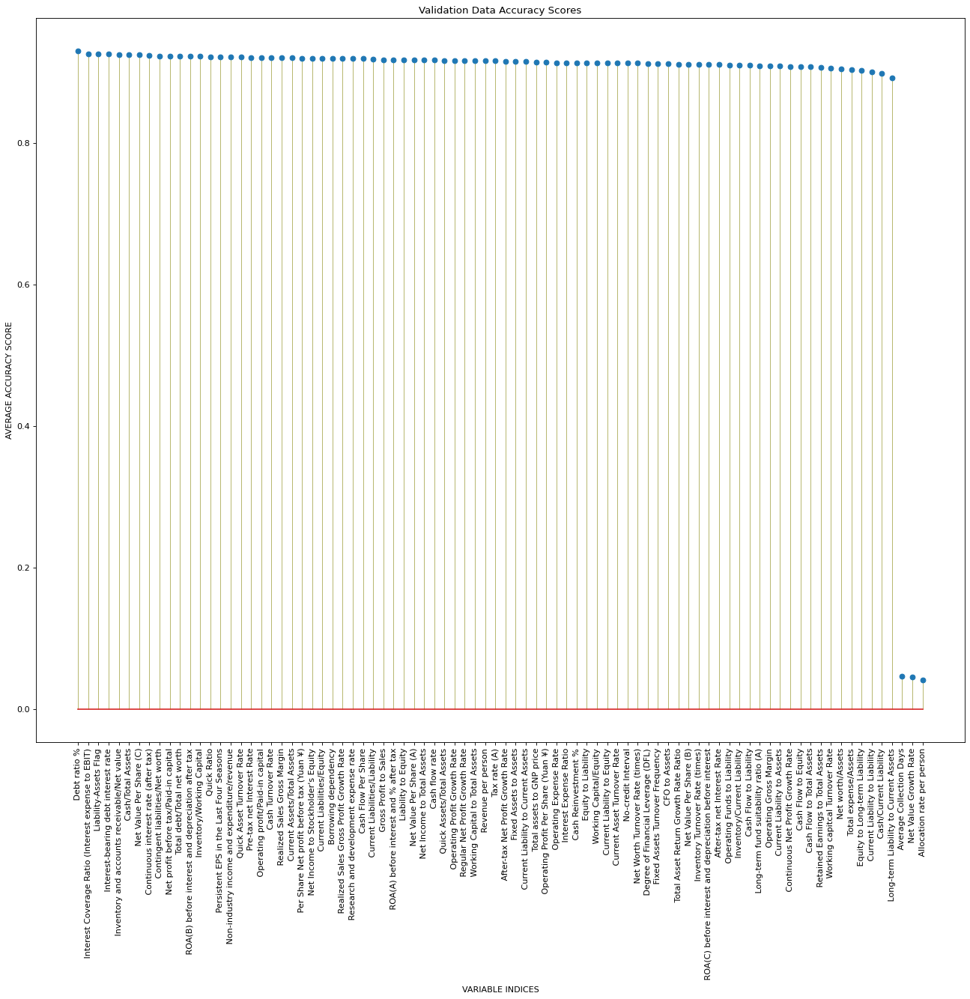

In [ ]:
# randomly order the explanatory variables and run Naive Bayes on these smaller
#  subsets of explanatory variables; for each run, record accuracy scores for
#  each explanatory variable and sum them up at the end

from sklearn.naive_bayes import GaussianNB
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score

N_VARS_IN_GROUP = 3  # how many explanatory variables in a subset group
N_ITER = 1000  # do this many iterations (epochs) of the data

#scoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
trainScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
valScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)

# go through the epochs
for rowNumber in range(N_ITER):
  
  # use modulo operator to select certain iterations to print status
  if rowNumber % 100 == 0:
    print('Iteration number =', rowNumber)

  firstColIndex = 0
  lastColIndex = firstColIndex + N_VARS_IN_GROUP - 1

  #--------------------------------------------------------------
  # go through each subset group of explanatory variables
  while lastColIndex < nExplan:

    trainGroupDF = trainDF.iloc[:, firstColIndex:lastColIndex]
    valGroupDF = valDF.iloc[:, firstColIndex:lastColIndex]

    #print('\nCurrent columns being looked at:', groupDF.columns)
    #print('   There are', len(groupDF.columns), 'columns in the group.')

    # perform desired method (e.g., Gaussian Naive Bayes)
    gnb = GaussianNB()
    gnb.fit(trainGroupDF, yTrain)

    #gnb.fit(groupDF, y)
    #yPredict = gnb.predict(groupDF)
    
    #if np.isnan(yPredict):
    #  yPredict = 0
    yPredict_train = gnb.predict(trainGroupDF)
    yPredict_val = gnb.predict(valGroupDF)

    # record the accuracy scores for the group
    #accuracyScore = accuracy_score(y, yPredict)
    #print('   Accuracy score =', accuracyScore)
    #print('Iteration =',rowNumber,'; Score =', accuracyScore)
    #print('First column index =', firstColIndex, '; Last column index =', lastColIndex)
    trainAccuracyScore = accuracy_score(yTrain, yPredict_train)
    valAccuracyScore = accuracy_score(yVal, yPredict_val)

    # record the score for all variables in the subset group
    for bb in range(firstColIndex,lastColIndex):
      #scoreDF.iat[rowNumber, bb] = accuracyScore
      trainScoreDF.iat[rowNumber, bb] = trainAccuracyScore
      valScoreDF.iat[rowNumber, bb] = valAccuracyScore

    # shift the indices to the next subset group of explanatory variables
    firstColIndex += 1
    lastColIndex += 1

  # after going thru all subsets and all explanatory variables,
  #   randomize the order of the explanatory variables for the next epoch
  random.shuffle(columnNumbers)

  #Xdf_reducedA = Xdf_reducedA.iloc[:, columnNumbers]

  trainScoreDF = trainScoreDF.iloc[:, columnNumbers]
  valScoreDF = valScoreDF.iloc[:, columnNumbers]
  trainDF = trainDF.iloc[:, columnNumbers]
  valDF = valDF.iloc[:, columnNumbers]

#------------------------------------------------------------
# plot the accuracy results for the validation data
import pylab
from matplotlib.pyplot import figure

# create dataframe of validation data variable scores
valScoreTotal = pd.DataFrame()
valScoreTotal['Variable'] = valScoreDF.columns
valScoreTotal['Score'] = list(valScoreDF.sum())
valSumOfScoresDF = valScoreTotal.sort_values(by=['Score'], ascending=False)
valSumOfScoresDF = valSumOfScoresDF.reset_index(drop=True)

figure(figsize=(20, 16), dpi=80)

# plot validation data score results
x = valSumOfScoresDF.Variable
y = valSumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Validation Data Accuracy Scores')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


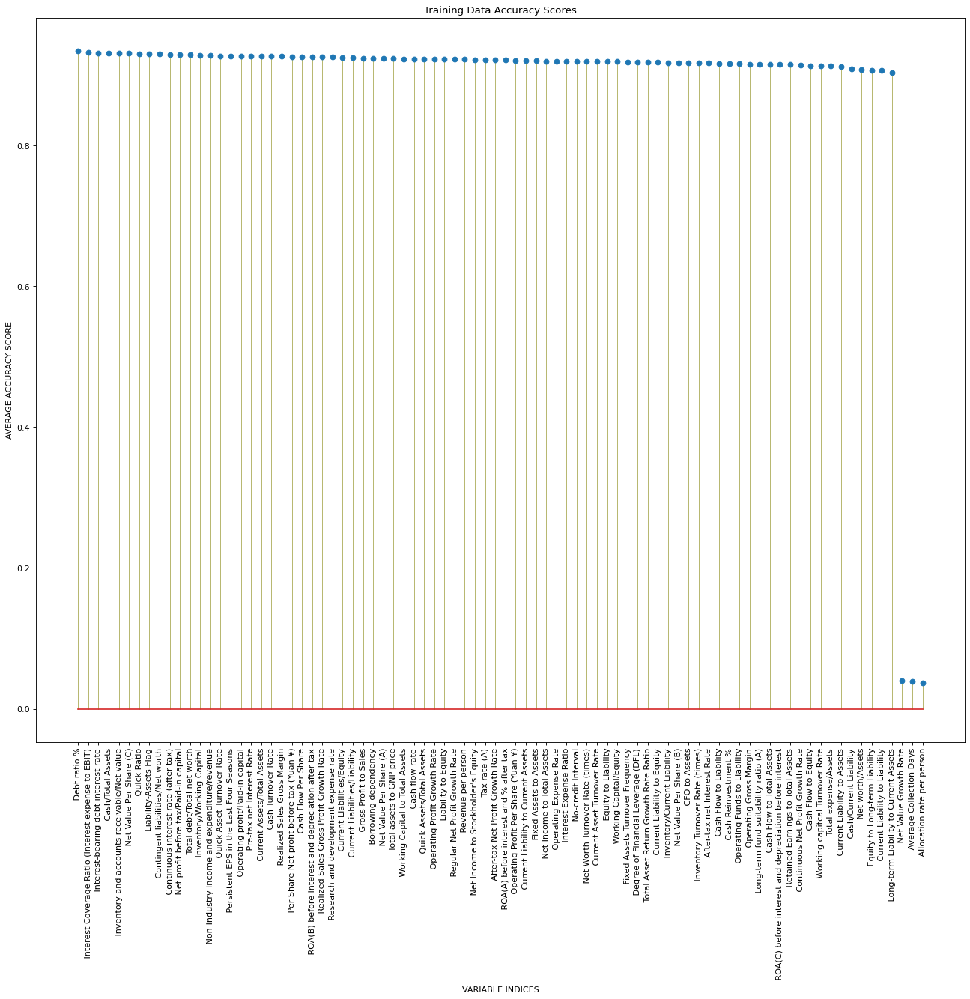

In [ ]:
# plot the accuracy results for the training data
import pylab
from matplotlib.pyplot import figure

# create dataframe of train data variable scores
trainScoreTotal = pd.DataFrame()
trainScoreTotal['Variable'] = trainScoreDF.columns
trainScoreTotal['Score'] = list(trainScoreDF.sum())
trainSumOfScoresDF = trainScoreTotal.sort_values(by=['Score'], ascending=False)
trainSumOfScoresDF = trainSumOfScoresDF.reset_index(drop=True)

figure(figsize=(20, 16), dpi=80)

# plot training data score results
x = trainSumOfScoresDF.Variable
y = trainSumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Training Data Accuracy Scores')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

The latest runs above suggest 'Allocation rate per person', 'Average Collection Days', and 'Net Value Growth Rate' are not significant explanatory variables

In [ ]:
# extract the response variable and explanatory variable columns and
#   remove the constant column 'Net Income Flag'
y = origDF['Bankrupt?']
Xdf = origDF_minMax.copy()
Xdf = Xdf.drop(columns=['Bankrupt?', ' Net Income Flag'])

# remove the other columns specified above and re-run Naive Bayes
print('The number of columns in Xdf is', len(Xdf.columns))
Xdf_reduced = Xdf.copy()
Xdf_reduced = Xdf_reduced.drop([' Quick Assets/Current Liability',
                                     ' Revenue Per Share (Yuan ¥)',
                                     ' Current Ratio',' Cash Flow to Sales',
                                     ' Total income/Total expense'], axis=1)

print('The number of columns in Xdf_reduced is', len(Xdf_reduced.columns))
Xdf_reducedA = Xdf_reduced.copy()
Xdf_reducedA = Xdf_reducedA.drop([' Total Asset Turnover', ' Operating Profit Rate'], axis=1)
print('The number of columns in Xdf_reducedA is', len(Xdf_reducedA.columns))
Xdf_reducedB = Xdf_reducedA.copy()
Xdf_reducedB = Xdf_reducedB.drop([' Operating profit per person', ' Accounts Receivable Turnover', ' Total Asset Growth Rate'], axis=1)
print('The number of columns in Xdf_reducedB is', len(Xdf_reducedB.columns))
#----------------------------------------------------------------------------
Xdf_reducedC = Xdf_reducedB.copy()
Xdf_reducedC = Xdf_reducedC.drop([' Allocation rate per person', ' Average Collection Days', ' Net Value Growth Rate'], axis=1)
print('\nThe number of columns in Xdf_reducedC is', len(Xdf_reducedC.columns))
#---------------------------------------------------------------------------
# revise the list of column names
allVariableNames = tuple(Xdf_reducedC.columns)
explanNames = list(allVariableNames)
nExplan = len(explanNames)
print('In other words, there are now', nExplan, 'explanatory variables')

# create sequence of column numbers to be randomized
columnNumbers = list(range(0,nExplan))

The number of columns in Xdf is 94
The number of columns in Xdf_reduced is 89
The number of columns in Xdf_reducedA is 87
The number of columns in Xdf_reducedB is 84

The number of columns in Xdf_reducedC is 81
In other words, there are now 81 explanatory variables


In [ ]:
# split into training and validation datasets
from sklearn.model_selection import train_test_split
y = origDF['Bankrupt?']
X = Xdf_reducedC.copy()

trainDF, valDF, yTrain, yVal = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [ ]:
# create sequence of column numbers to be randomized
columnNumbers = list(range(0, len(trainDF.columns)))
columnNumbersVal = list(range(0, len(valDF.columns)))
if columnNumbersVal == columnNumbers:
  print('Column numbers A-OK!')
  print('There are', len(columnNumbers), 'columns !!!')
else:
  print('UH-OH, COLUMN NUMBERS DO NOT MATCH !!!\n')
  valDF = valDF.iloc[:, columnNumbers]

Column numbers A-OK!
There are 81 columns !!!


Iteration number = 0
Iteration number = 100
Iteration number = 200
Iteration number = 300
Iteration number = 400
Iteration number = 500
Iteration number = 600
Iteration number = 700
Iteration number = 800
Iteration number = 900
Iteration number = 1000
Iteration number = 1100
Iteration number = 1200
Iteration number = 1300
Iteration number = 1400
Iteration number = 1500
Iteration number = 1600
Iteration number = 1700
Iteration number = 1800
Iteration number = 1900
Iteration number = 2000
Iteration number = 2100
Iteration number = 2200
Iteration number = 2300
Iteration number = 2400
Iteration number = 2500
Iteration number = 2600
Iteration number = 2700
Iteration number = 2800
Iteration number = 2900


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


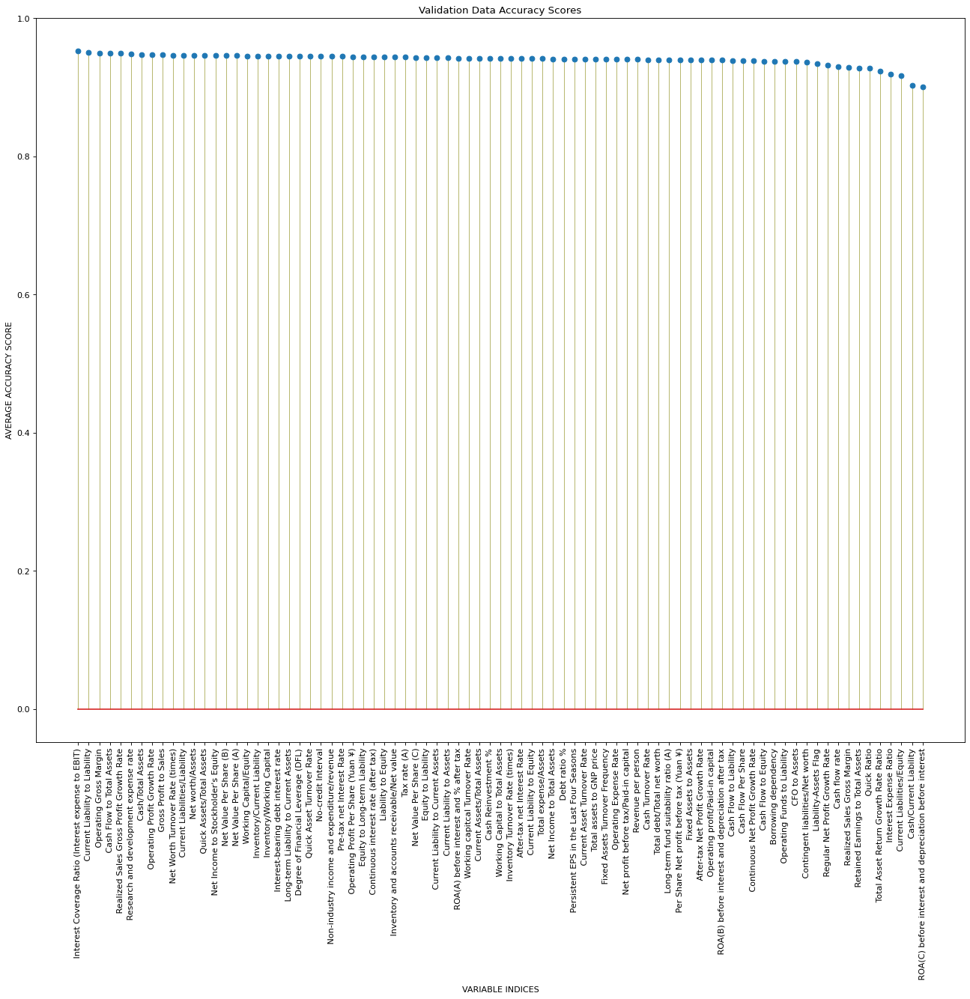

In [ ]:
# randomly order the explanatory variables and run Naive Bayes on these smaller
#  subsets of explanatory variables; for each run, record accuracy scores for
#  each explanatory variable and sum them up at the end

from sklearn.naive_bayes import GaussianNB
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score

N_VARS_IN_GROUP = 5  # how many explanatory variables in a subset group
N_ITER = 3000  # do this many iterations (epochs) of the data

#scoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
trainScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
valScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)

# go through the epochs
for rowNumber in range(N_ITER):
  
  # use modulo operator to select certain iterations to print status
  if rowNumber % 100 == 0:
    print('Iteration number =', rowNumber)

  firstColIndex = 0
  lastColIndex = firstColIndex + N_VARS_IN_GROUP - 1

  #--------------------------------------------------------------
  # go through each subset group of explanatory variables
  while lastColIndex < nExplan:

    trainGroupDF = trainDF.iloc[:, firstColIndex:lastColIndex]
    valGroupDF = valDF.iloc[:, firstColIndex:lastColIndex]

    #print('\nCurrent columns being looked at:', groupDF.columns)
    #print('   There are', len(groupDF.columns), 'columns in the group.')

    # perform desired method (e.g., Gaussian Naive Bayes)
    gnb = GaussianNB()
    gnb.fit(trainGroupDF, yTrain)

    #gnb.fit(groupDF, y)
    #yPredict = gnb.predict(groupDF)
    
    #if np.isnan(yPredict):
    #  yPredict = 0
    yPredict_train = gnb.predict(trainGroupDF)
    yPredict_val = gnb.predict(valGroupDF)

    # record the accuracy scores for the group
    #accuracyScore = accuracy_score(y, yPredict)
    #print('   Accuracy score =', accuracyScore)
    #print('Iteration =',rowNumber,'; Score =', accuracyScore)
    #print('First column index =', firstColIndex, '; Last column index =', lastColIndex)
    trainAccuracyScore = accuracy_score(yTrain, yPredict_train)
    valAccuracyScore = accuracy_score(yVal, yPredict_val)

    # record the score for all variables in the subset group
    for bb in range(firstColIndex,lastColIndex):
      #scoreDF.iat[rowNumber, bb] = accuracyScore
      trainScoreDF.iat[rowNumber, bb] = trainAccuracyScore
      valScoreDF.iat[rowNumber, bb] = valAccuracyScore

    # shift the indices to the next subset group of explanatory variables
    firstColIndex += 1
    lastColIndex += 1

  # after going thru all subsets and all explanatory variables,
  #   randomize the order of the explanatory variables for the next epoch
  random.shuffle(columnNumbers)

  #Xdf_reducedA = Xdf_reducedA.iloc[:, columnNumbers]

  trainScoreDF = trainScoreDF.iloc[:, columnNumbers]
  valScoreDF = valScoreDF.iloc[:, columnNumbers]
  trainDF = trainDF.iloc[:, columnNumbers]
  valDF = valDF.iloc[:, columnNumbers]

#------------------------------------------------------------
# plot the accuracy results for the validation data
import pylab
from matplotlib.pyplot import figure

# create dataframe of validation data variable scores
valScoreTotal = pd.DataFrame()
valScoreTotal['Variable'] = valScoreDF.columns
valScoreTotal['Score'] = list(valScoreDF.sum())
valSumOfScoresDF = valScoreTotal.sort_values(by=['Score'], ascending=False)
valSumOfScoresDF = valSumOfScoresDF.reset_index(drop=True)

figure(figsize=(20, 16), dpi=80)

# plot validation data score results
x = valSumOfScoresDF.Variable
y = valSumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Validation Data Accuracy Scores')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


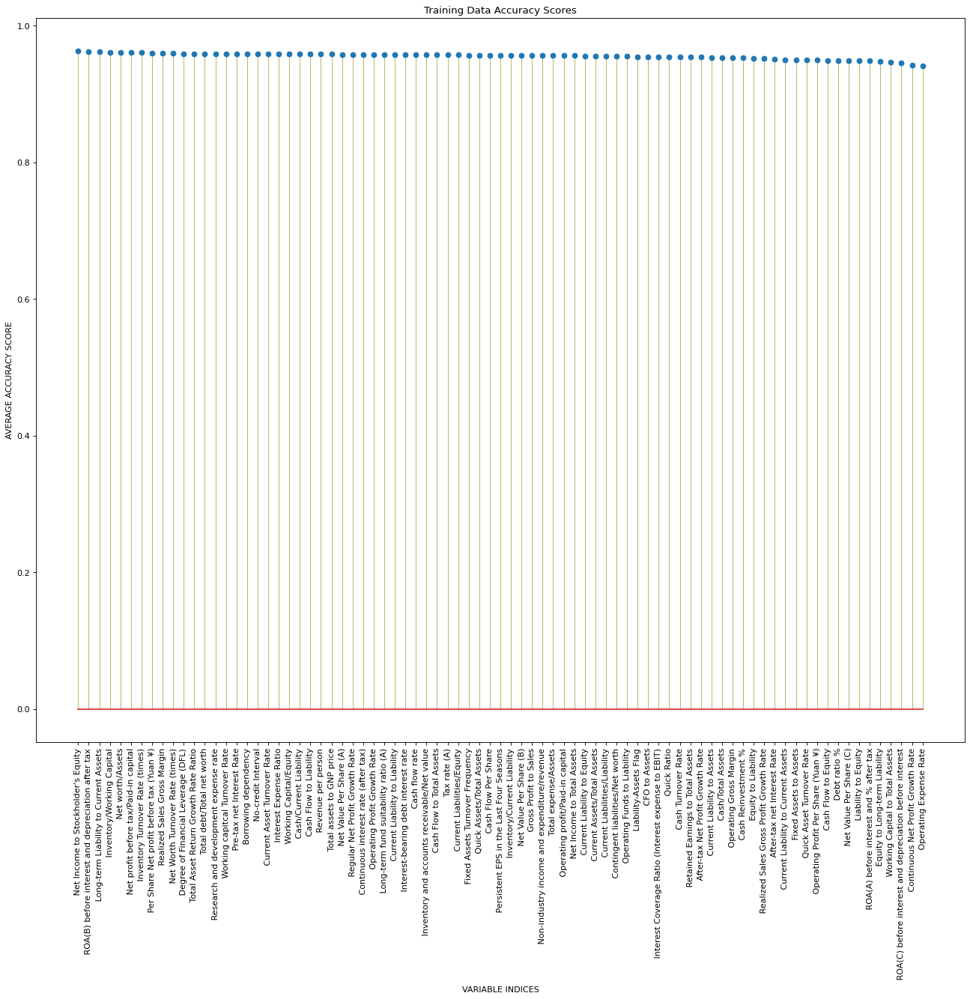

In [ ]:
# plot the accuracy results for the training data
import pylab
from matplotlib.pyplot import figure

# create dataframe of train data variable scores
trainScoreTotal = pd.DataFrame()
trainScoreTotal['Variable'] = trainScoreDF.columns
trainScoreTotal['Score'] = list(trainScoreDF.sum())
trainSumOfScoresDF = trainScoreTotal.sort_values(by=['Score'], ascending=False)
trainSumOfScoresDF = trainSumOfScoresDF.reset_index(drop=True)

figure(figsize=(20, 16), dpi=80)

# plot training data score results
x = trainSumOfScoresDF.Variable
y = trainSumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Training Data Accuracy Scores')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

# display the stem plot
plt.show()

=====================================================================================================

In [ ]:
# extract the response variable and explanatory variable columns and
#   remove the constant column 'Net Income Flag'
y = origDF['Bankrupt?']
Xdf = origDF_minMax.copy()
Xdf = Xdf.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing the response variable and insignificant explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(Xdf.columns))
#---------------------------------------------------------------------------
# revise the list of column names
allVariableNames = tuple(Xdf.columns)
explanNames = list(allVariableNames)
nExplan = len(explanNames)
print('In other words, there are now', nExplan, 'explanatory variables')

# create sequence of column numbers to be randomized
columnNumbers = list(range(0,nExplan))

#=============================================================
# split into training and validation datasets
from sklearn.model_selection import train_test_split
y = origDF['Bankrupt?']
X = Xdf.copy()
trainDF, valDF, yTrain, yVal = train_test_split(X, y, test_size = 0.2, random_state = 42)

The original number of columns in the data is 96

After removing the response variable and insignificant explanatory variables,
  the number of columns in the reduced dataframe is 81
In other words, there are now 81 explanatory variables


In [ ]:
# create sequence of column numbers to be randomized
columnNumbers = list(range(0, len(trainDF.columns)))
columnNumbersVal = list(range(0, len(valDF.columns)))
if columnNumbersVal == columnNumbers:
  print('\nColumn numbers A-OK!')
  print('There are', len(columnNumbers), 'columns !!!')
else:
  print('UH-OH, COLUMN NUMBERS DO NOT MATCH !!!\n')
  valDF = valDF.iloc[:, columnNumbers]


Column numbers A-OK!
There are 81 columns !!!


Iteration number = 0
Iteration number = 500
Iteration number = 1000
Iteration number = 1500
Iteration number = 2000
Iteration number = 2500
Iteration number = 3000
Iteration number = 3500


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:78: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


Text(0, 0.5, 'AVERAGE ACCURACY SCORE')

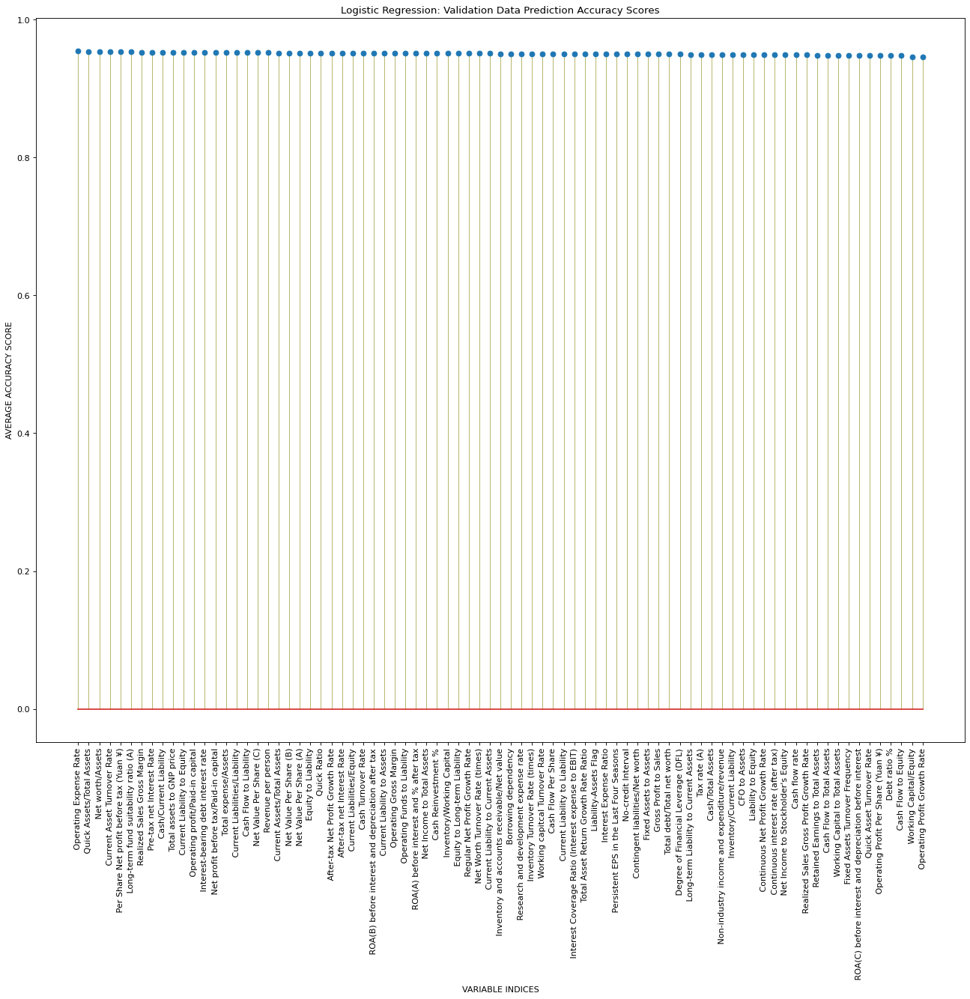

In [ ]:
# randomly order the explanatory variables and run logistic regression on these smaller
#  subsets of explanatory variables; for each run, record accuracy scores for
#  each explanatory variable and sum them up at the end

#=======================================================================
N_VARS_IN_GROUP = 3  # how many explanatory variables in a subset group
N_ITER = 4000  # do this many iterations (epochs) of the data
ITER_NOTIFICATION = 500  # when loop status is shown 
#=======================================================================

#scoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
trainScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)
valScoreDF = pd.DataFrame(index=range(N_ITER), columns=explanNames)

# go through the iterations
for rowNumber in range(N_ITER):
  
  # use modulo operator to select certain iterations to print status
  if rowNumber % ITER_NOTIFICATION == 0:
    print('Iteration number =', rowNumber)

  firstColIndex = 0
  lastColIndex = firstColIndex + N_VARS_IN_GROUP - 1

  #--------------------------------------------------------------
  # go through each subset group of explanatory variables
  while lastColIndex < nExplan:

    trainGroupDF = trainDF.iloc[:, firstColIndex:lastColIndex]
    valGroupDF = valDF.iloc[:, firstColIndex:lastColIndex]

    # perform desired method (e.g., Gaussian Naive Bayes)
    log_reg = LogisticRegression()
    log_reg.fit(trainGroupDF, yTrain)
    
    yPredict_train = log_reg.predict(trainGroupDF)
    yPredict_val = log_reg.predict(valGroupDF)

    # record the accuracy scores for the group
    trainAccuracyScore = accuracy_score(yTrain, yPredict_train)
    valAccuracyScore = accuracy_score(yVal, yPredict_val)

    # record the score for all variables in the subset group
    for bb in range(firstColIndex,lastColIndex):
      trainScoreDF.iat[rowNumber, bb] = trainAccuracyScore
      valScoreDF.iat[rowNumber, bb] = valAccuracyScore

    # shift the indices to the next subset group of explanatory variables
    firstColIndex += 1
    lastColIndex += 1

  # after going thru all subsets and all explanatory variables,
  #   randomize the order of the explanatory variables for the next epoch
  random.shuffle(columnNumbers)

  trainScoreDF = trainScoreDF.iloc[:, columnNumbers]
  valScoreDF = valScoreDF.iloc[:, columnNumbers]
  trainDF = trainDF.iloc[:, columnNumbers]
  valDF = valDF.iloc[:, columnNumbers]

#------------------------------------------------------------
# plot the accuracy results for the validation data

# create dataframe of validation data variable scores
valScoreTotal = pd.DataFrame()
valScoreTotal['Variable'] = valScoreDF.columns
valScoreTotal['Score'] = list(valScoreDF.sum())
valSumOfScoresDF = valScoreTotal.sort_values(by=['Score'], ascending=False)
valSumOfScoresDF = valSumOfScoresDF.reset_index(drop=True)

figure(figsize=(20, 16), dpi=80)

# plot validation data score results
x = valSumOfScoresDF.Variable
y = valSumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Logistic Regression: Validation Data Prediction Accuracy Scores')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


Text(0, 0.5, 'AVERAGE ACCURACY SCORE')

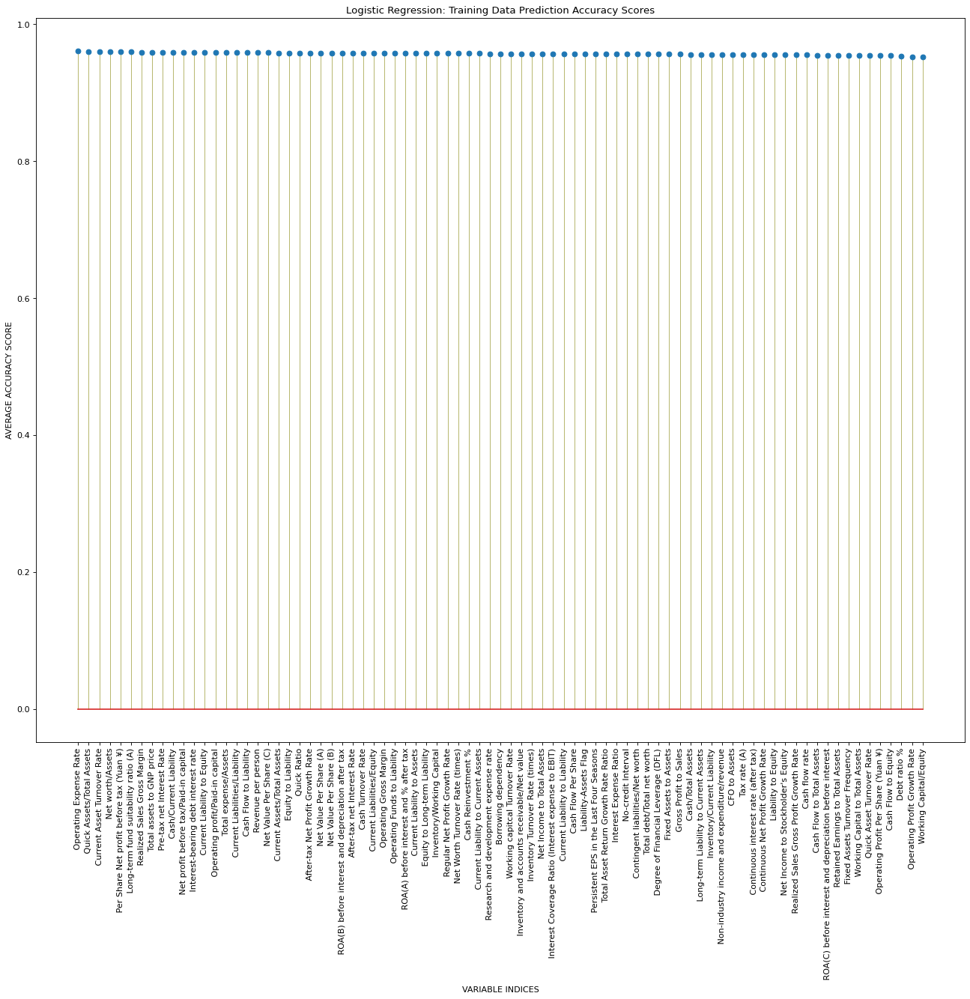

In [ ]:
# plot the accuracy results for the training data

# create dataframe of training data variable scores
trainScoreTotal = pd.DataFrame()
trainScoreTotal['Variable'] = trainScoreDF.columns
trainScoreTotal['Score'] = list(trainScoreDF.sum())
trainSumOfScoresDF = trainScoreTotal.sort_values(by=['Score'], ascending=False)
trainSumOfScoresDF = trainSumOfScoresDF.reset_index(drop=True)

figure(figsize=(20, 16), dpi=80)

# plot validation data score results
x = trainSumOfScoresDF.Variable
y = trainSumOfScoresDF.Score/N_ITER

# plot the stem plot using matplotlib
(markers, stemlines, baseline) = plt.stem(x,y)
plt.setp(stemlines, linestyle="-", color="olive", linewidth=0.5 )

# Provide a title for the stem plot
plt.title('Logistic Regression: Training Data Prediction Accuracy Scores')

# Give x axis label for the stem plot
plt.xlabel('VARIABLE INDICES')
plt.xticks(rotation = 90)

# Give y axis label for the stem plot
plt.ylabel('AVERAGE ACCURACY SCORE')

# set the x axis and y axis limits
#pylab.xlim([0,10])
#pylab.ylim([0,100])

========================================================================================================

**START HERE after loading data and performining Min-Max normalization ...**

**Create correlation heatmap to assess correlations of explanatory variables with each other and with the Response Variable.**

In [ ]:
# add the response variable to the dataframe
Xdf = origDF_minMax.copy()
corrXdf = Xdf.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and the insignificant explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(corrXdf.columns))

The original number of columns in the data is 96

After removing Bankrupt? and the insignificant explanatory variables,
  the number of columns in the reduced dataframe is 81


In [ ]:
columnNumbers = list(range(0, len(corrXdf.columns)))

# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)

corrXdf = corrXdf.iloc[:, columnNumbers]

#df1 = corrXdf.iloc[:, 0:15]

columns1 = list(range(0, 15))
columns2 = list(range(15, 31))
columns3 = list(range(31, 47))
columns4 = list(range(47, 64))
columns5 = list(range(64, 81))

columnNames = corrXdf.columns

df1 = pd.DataFrame(index=corrXdf.index, columns=columnNames[columns1])
df2 = pd.DataFrame(index=corrXdf.index, columns=columnNames[columns2])
df3 = pd.DataFrame(index=corrXdf.index, columns=columnNames[columns3])
df4 = pd.DataFrame(index=corrXdf.index, columns=columnNames[columns4])
df5 = pd.DataFrame(index=corrXdf.index, columns=columnNames[columns5])

for aa in columns1:
  df1.iloc[:,aa] = corrXdf.iloc[:,aa]
  print('aa is', aa) 
print('\n')

for aa in columns2:
  colIndex = aa-max(columns1) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df2.iloc[:, colIndex] = corrXdf.iloc[:, aa]
print('\n')

for aa in columns3:
  colIndex = aa-max(columns2) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df3.iloc[:, colIndex] = corrXdf.iloc[:, aa]
print('\n')

for aa in columns4:
  colIndex = aa-max(columns3) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df4.iloc[:, colIndex] = corrXdf.iloc[:,aa]
print('\n')

for aa in columns5:
  colIndex = aa-max(columns4) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df5.iloc[:, colIndex] = corrXdf.iloc[:,aa]

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df3['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df4['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df5['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14


aa is 15 ; colIndex is 0
aa is 16 ; colIndex is 1
aa is 17 ; colIndex is 2
aa is 18 ; colIndex is 3
aa is 19 ; colIndex is 4
aa is 20 ; colIndex is 5
aa is 21 ; colIndex is 6
aa is 22 ; colIndex is 7
aa is 23 ; colIndex is 8
aa is 24 ; colIndex is 9
aa is 25 ; colIndex is 10
aa is 26 ; colIndex is 11
aa is 27 ; colIndex is 12
aa is 28 ; colIndex is 13
aa is 29 ; colIndex is 14
aa is 30 ; colIndex is 15


aa is 31 ; colIndex is 0
aa is 32 ; colIndex is 1
aa is 33 ; colIndex is 2
aa is 34 ; colIndex is 3
aa is 35 ; colIndex is 4
aa is 36 ; colIndex is 5
aa is 37 ; colIndex is 6
aa is 38 ; colIndex is 7
aa is 39 ; colIndex is 8
aa is 40 ; colIndex is 9
aa is 41 ; colIndex is 10
aa is 42 ; colIndex is 11
aa is 43 ; colIndex is 12
aa is 44 ; colIndex is 13
aa is 45 ; colIndex is 14
aa is 46 ; colIndex is 15


aa is 47 ; colIndex is 0
aa is 48 ; colIndex is 1
aa is 4

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

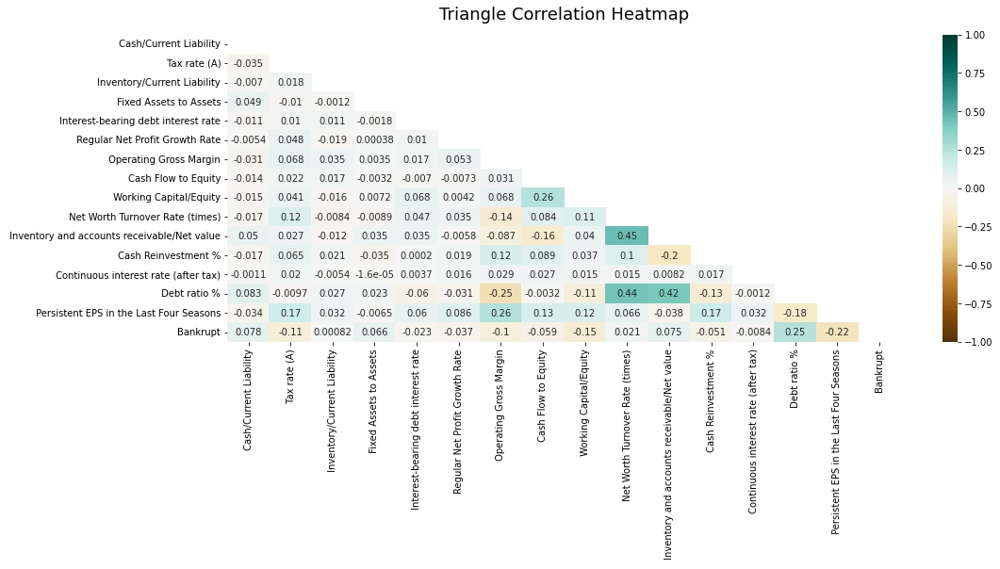

In [ ]:
plt.figure(figsize=(16, 6))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

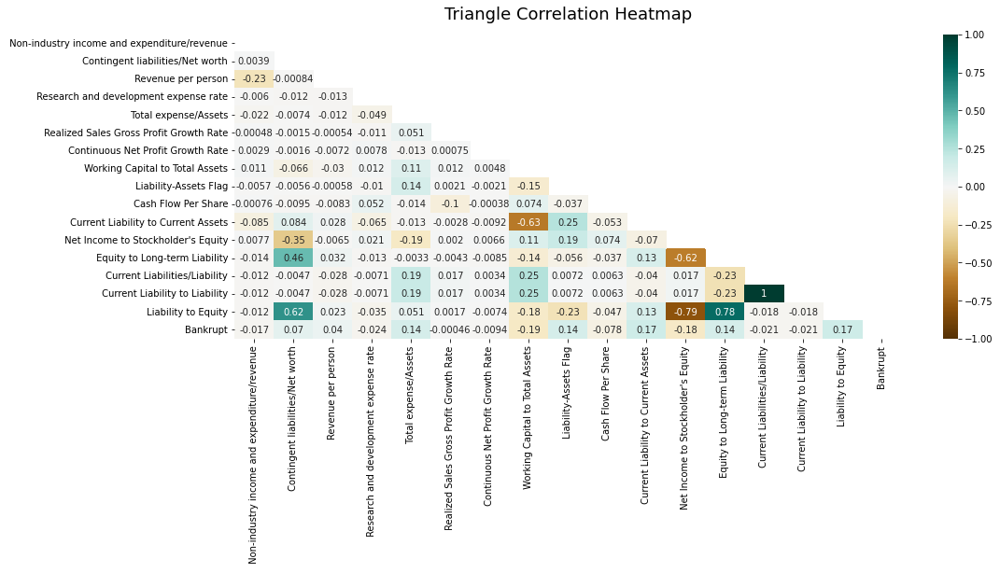

In [ ]:
plt.figure(figsize=(16, 6))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df2.corr(), dtype=bool))
heatmap = sns.heatmap(df2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

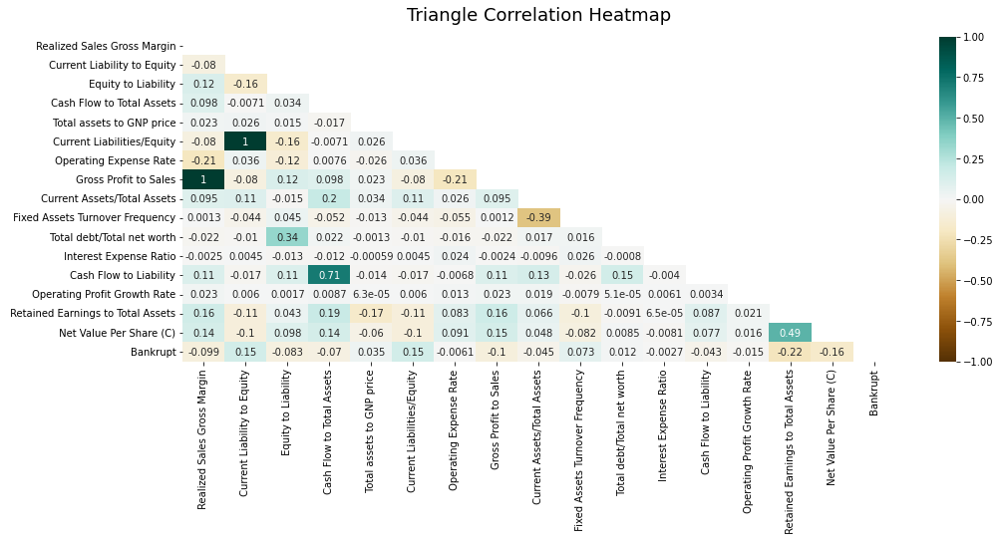

In [ ]:
plt.figure(figsize=(16, 6))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df3.corr(), dtype=bool))
heatmap = sns.heatmap(df3.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

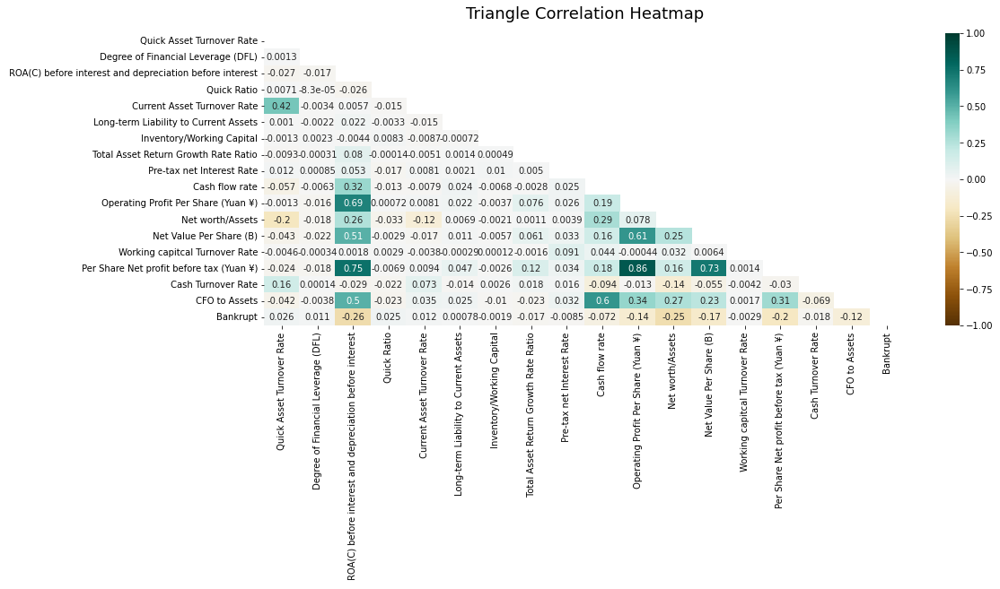

In [ ]:
plt.figure(figsize=(16, 6))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df4.corr(), dtype=bool))
heatmap = sns.heatmap(df4.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

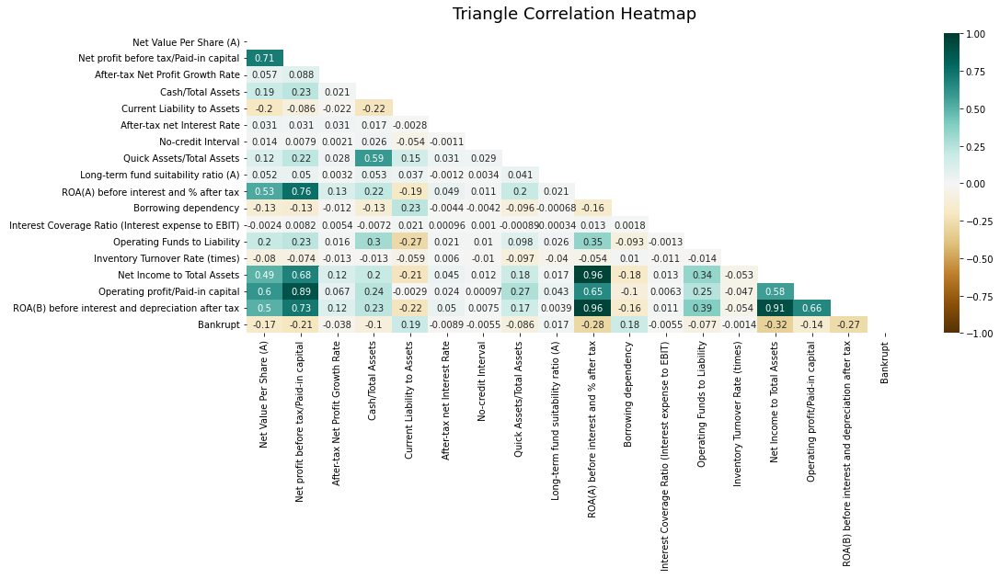

In [ ]:
plt.figure(figsize=(16, 6))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df5.corr(), dtype=bool))
heatmap = sns.heatmap(df5.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

Based upon the correlation plots above:
*   Current Liability to Liability has 100% correlation Current Liabilities/Liability (remove the former)
*   Current Liabilities/Equity has 100% correlation to Current Liability to Equity (remove the former)
*   Gross Profit to Sales has 100% correlation with Realized Sales Gross Margin (remove the latter)
*   Net Income to Total Assets, ROA(B) before interest and depreciation after tax, and ROA(A) before interest and % after tax are highly correlated (remove the last two)
*   Net profit before tax/Paid-in Capital and Operating profit/Paid-in capital are highly correlated (remove the latter)
*   Per Share Net profit before tax (Yuan ¥) and Operating Profit Per Share (Yuan ¥) are highly correlated (remove the latter)



In [ ]:
# create new dataframe
Xdf2 = origDF_minMax.copy()
corrXdf2 = Xdf2.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate',
                        ' Current Liabilities/Liability', ' Current Liabilities/Equity',
                        ' Realized Sales Gross Margin', ' ROA(A) before interest and % after tax',
                        ' ROA(B) before interest and depreciation after tax',
                        ' Operating profit/Paid-in capital',
                        ' Operating Profit Per Share (Yuan ¥)'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and the insignificant explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(corrXdf2.columns))

The original number of columns in the data is 96

After removing Bankrupt? and the insignificant explanatory variables,
  the number of columns in the reduced dataframe is 74


In [ ]:
columnNumbers = list(range(0, len(corrXdf2.columns)))

# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)

corrXdf2 = corrXdf2.iloc[:, columnNumbers]

columns1 = list(range(0, 24))
columns2 = list(range(24, 50))
columns3 = list(range(50, 74))

columnNames = corrXdf2.columns

df1 = pd.DataFrame(index=corrXdf2.index, columns=columnNames[columns1])
df2 = pd.DataFrame(index=corrXdf2.index, columns=columnNames[columns2])
df3 = pd.DataFrame(index=corrXdf2.index, columns=columnNames[columns3])

for aa in columns1:
  df1.iloc[:,aa] = corrXdf2.iloc[:,aa]
  print('aa is', aa) 
print('\n')

for aa in columns2:
  colIndex = aa-max(columns1) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df2.iloc[:, colIndex] = corrXdf2.iloc[:, aa]
print('\n')

for aa in columns3:
  colIndex = aa-max(columns2) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df3.iloc[:, colIndex] = corrXdf2.iloc[:, aa]
print('\n')

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df3['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14
aa is 15
aa is 16
aa is 17
aa is 18
aa is 19
aa is 20
aa is 21
aa is 22
aa is 23


aa is 24 ; colIndex is 0
aa is 25 ; colIndex is 1
aa is 26 ; colIndex is 2
aa is 27 ; colIndex is 3
aa is 28 ; colIndex is 4
aa is 29 ; colIndex is 5
aa is 30 ; colIndex is 6
aa is 31 ; colIndex is 7
aa is 32 ; colIndex is 8
aa is 33 ; colIndex is 9
aa is 34 ; colIndex is 10
aa is 35 ; colIndex is 11
aa is 36 ; colIndex is 12
aa is 37 ; colIndex is 13
aa is 38 ; colIndex is 14
aa is 39 ; colIndex is 15
aa is 40 ; colIndex is 16
aa is 41 ; colIndex is 17
aa is 42 ; colIndex is 18
aa is 43 ; colIndex is 19
aa is 44 ; colIndex is 20
aa is 45 ; colIndex is 21
aa is 46 ; colIndex is 22
aa is 47 ; colIndex is 23
aa is 48 ; colIndex is 24
aa is 49 ; colIndex is 25


aa is 50 ; colIndex is 0
aa is 51 ; colIndex is 1
aa is 52 ; colIndex is 2
aa is 53 ; colIndex is 3
aa is 54 ; colIndex is 4

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

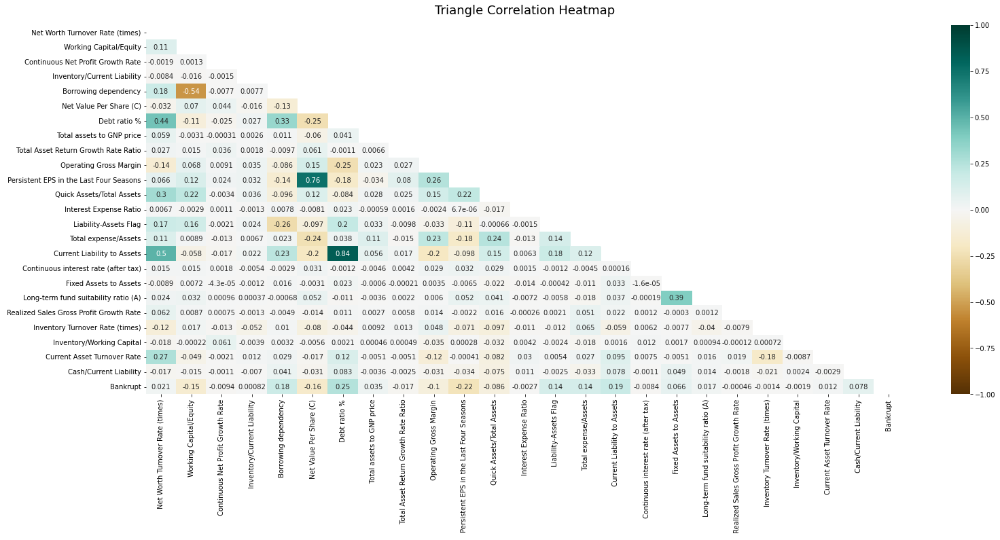

In [ ]:
plt.figure(figsize=(25, 10))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

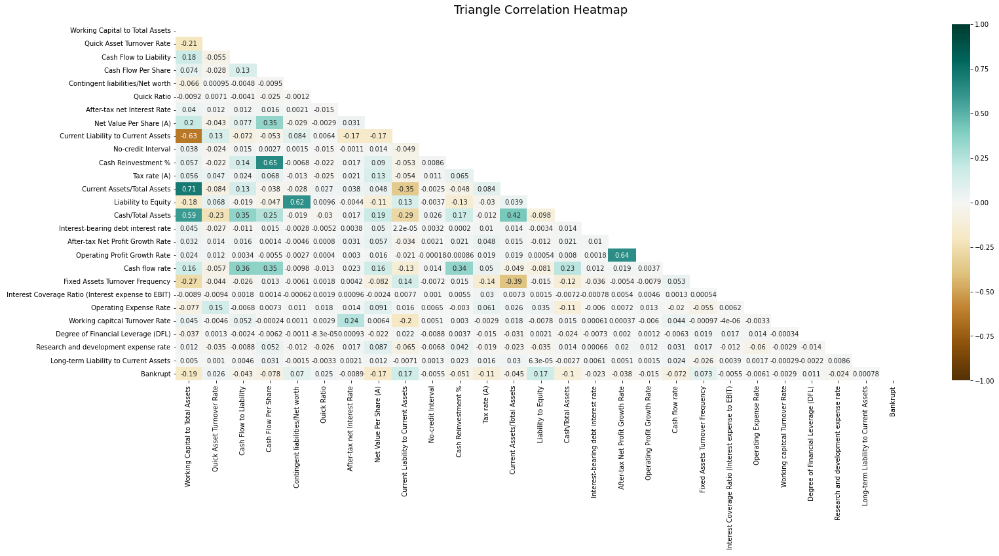

In [ ]:
plt.figure(figsize=(25, 10))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df2.corr(), dtype=bool))
heatmap = sns.heatmap(df2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

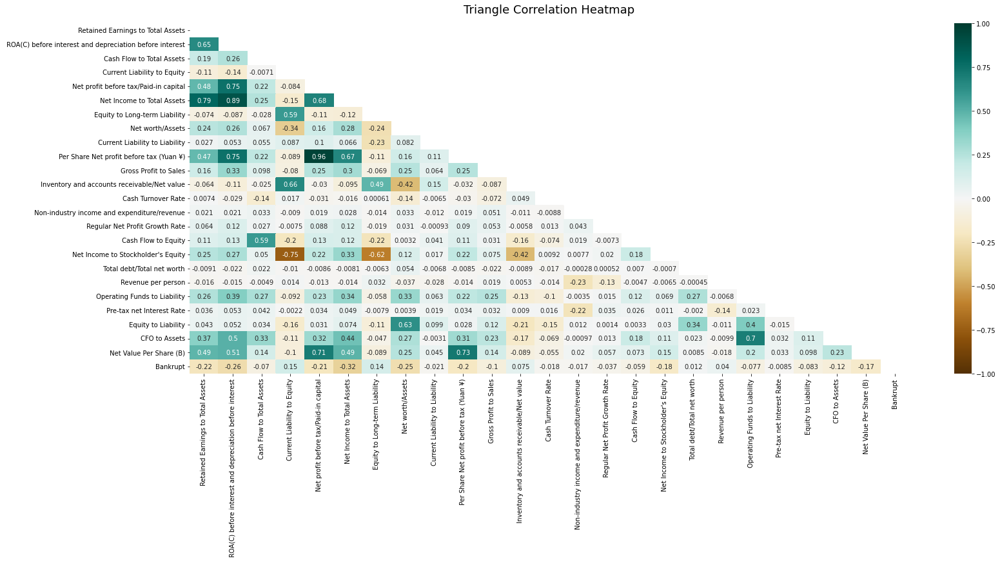

In [ ]:
plt.figure(figsize=(25, 10))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df3.corr(), dtype=bool))
heatmap = sns.heatmap(df3.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

Based upon the correlation plots above:
*   Current Liability to Assets is highly correlated with Debt ratio % (remove the latter)
*   Per Share Net profit before tax (Yuan ¥) is highly correlated with Net profit befre tax/Paid-in capital (remove the former)
*   Net Income to Total Assets is highly correlated with ROA(C) before interest and depreciation before interest (remove the latter)
*   Net Income to Total Assets is highly correlated with Retained Earnings to Total Assets (remove the latter)

In [ ]:
# copy the min-max dataframe
Xdf3 = origDF_minMax.copy()

In [ ]:
# remove columns
corrXdf3 = Xdf3.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate',
                        ' Current Liabilities/Liability', ' Current Liabilities/Equity',
                        ' Realized Sales Gross Margin', ' ROA(A) before interest and % after tax',
                        ' ROA(B) before interest and depreciation after tax',
                        ' Operating profit/Paid-in capital',' Operating Profit Per Share (Yuan ¥)',
                        ' Debt ratio %', ' Per Share Net profit before tax (Yuan ¥)',
                        ' ROA(C) before interest and depreciation before interest',
                        ' Retained Earnings to Total Assets'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and the insignificant explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(corrXdf3.columns))

The original number of columns in the data is 96

After removing Bankrupt? and the insignificant explanatory variables,
  the number of columns in the reduced dataframe is 70


In [ ]:
columnNumbers = list(range(0, len(corrXdf3.columns)))

# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)

corrXdf3 = corrXdf3.iloc[:, columnNumbers]

columns1 = list(range(0, 23))
columns2 = list(range(23, 46))
columns3 = list(range(46, 70))

columnNames = corrXdf3.columns

df1 = pd.DataFrame(index=corrXdf3.index, columns=columnNames[columns1])
df2 = pd.DataFrame(index=corrXdf3.index, columns=columnNames[columns2])
df3 = pd.DataFrame(index=corrXdf3.index, columns=columnNames[columns3])

for aa in columns1:
  df1.iloc[:,aa] = corrXdf3.iloc[:,aa]
  print('aa is', aa) 
print('\n')

for aa in columns2:
  colIndex = aa-max(columns1) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df2.iloc[:, colIndex] = corrXdf3.iloc[:, aa]
print('\n')

for aa in columns3:
  colIndex = aa-max(columns2) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df3.iloc[:, colIndex] = corrXdf3.iloc[:, aa]
print('\n')

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df3['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14
aa is 15
aa is 16
aa is 17
aa is 18
aa is 19
aa is 20
aa is 21
aa is 22


aa is 23 ; colIndex is 0
aa is 24 ; colIndex is 1
aa is 25 ; colIndex is 2
aa is 26 ; colIndex is 3
aa is 27 ; colIndex is 4
aa is 28 ; colIndex is 5
aa is 29 ; colIndex is 6
aa is 30 ; colIndex is 7
aa is 31 ; colIndex is 8
aa is 32 ; colIndex is 9
aa is 33 ; colIndex is 10
aa is 34 ; colIndex is 11
aa is 35 ; colIndex is 12
aa is 36 ; colIndex is 13
aa is 37 ; colIndex is 14
aa is 38 ; colIndex is 15
aa is 39 ; colIndex is 16
aa is 40 ; colIndex is 17
aa is 41 ; colIndex is 18
aa is 42 ; colIndex is 19
aa is 43 ; colIndex is 20
aa is 44 ; colIndex is 21
aa is 45 ; colIndex is 22


aa is 46 ; colIndex is 0
aa is 47 ; colIndex is 1
aa is 48 ; colIndex is 2
aa is 49 ; colIndex is 3
aa is 50 ; colIndex is 4
aa is 51 ; colIndex is 5
aa is 52 ; colIndex is 6
aa is 53 ; colIndex is 7
aa is 54 ; 

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

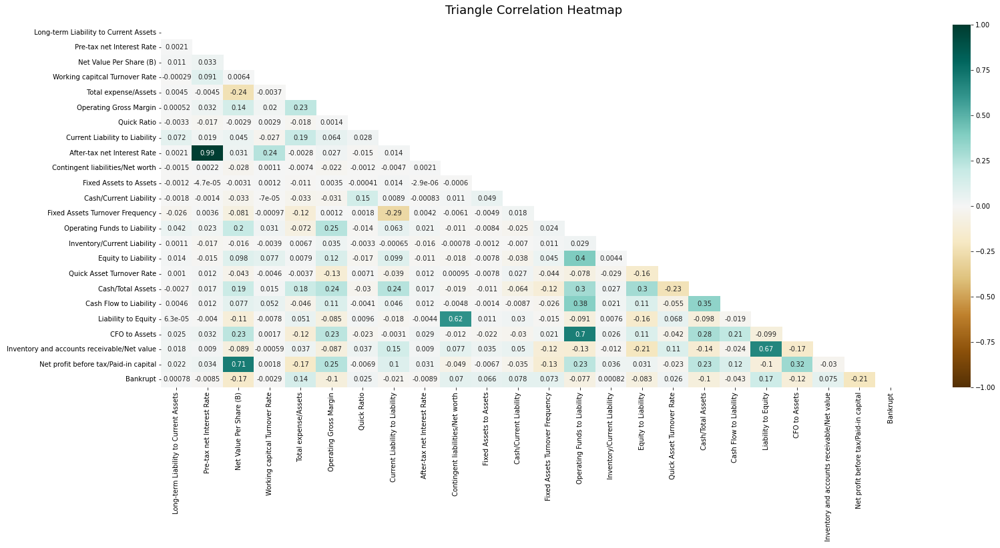

In [ ]:
plt.figure(figsize=(25, 10))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

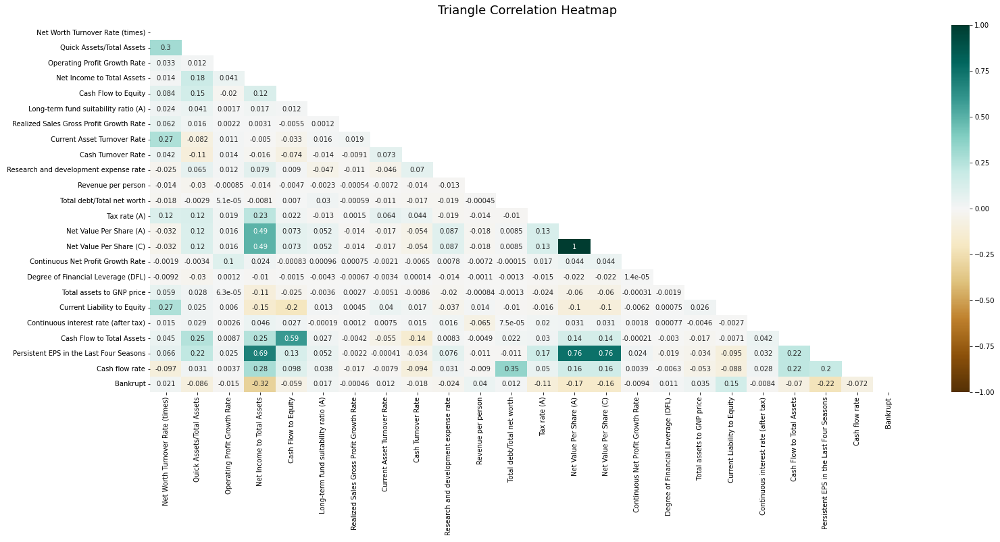

In [ ]:
plt.figure(figsize=(25, 10))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df2.corr(), dtype=bool))
heatmap = sns.heatmap(df2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

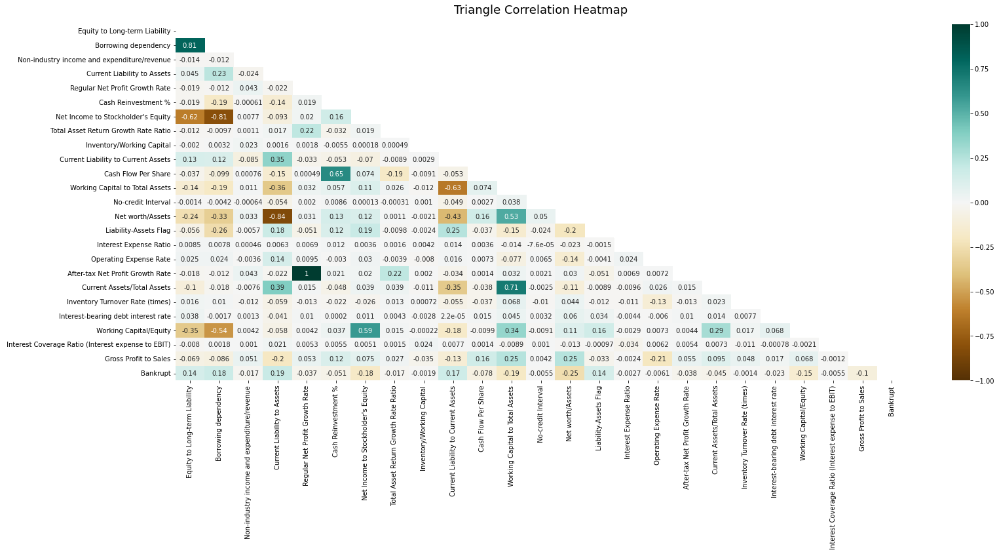

In [ ]:
plt.figure(figsize=(25, 10))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df3.corr(), dtype=bool))
heatmap = sns.heatmap(df3.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Based upon the correlation plots above:
*   After-tax net Interest Rate is highly correlated with Pre-tax net Interest Rate (remove the latter)
*   Net Value Per Share (A) is 100% correlated with Net Value Per Share (C) (remove the latter)
*   Borrowing dependency is highly correlated with Equity to Long-term Liability and Net Income to Stockholders Equity (remove Borrowing dependency)
*   After-tax Net Profit Growth Rate is 100% correlated with Regular Net Profit Growth Rate  (remove the latter)
*   Net worth/Assets is highly correlated with Current Liability to Assets (remove the latter)

In [ ]:
# copy the min-max dataframe
Xdf4 = origDF_minMax.copy()

In [ ]:
# remove columns
corrXdf4 = Xdf4.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate',
                        ' Current Liabilities/Liability', ' Current Liabilities/Equity',
                        ' Realized Sales Gross Margin', ' ROA(A) before interest and % after tax',
                        ' ROA(B) before interest and depreciation after tax',
                        ' Operating profit/Paid-in capital',' Operating Profit Per Share (Yuan ¥)',
                        ' Debt ratio %', ' Per Share Net profit before tax (Yuan ¥)',
                        ' ROA(C) before interest and depreciation before interest',
                        ' Retained Earnings to Total Assets', ' Pre-tax net Interest Rate',
                        ' Net Value Per Share (C)', ' Borrowing dependency',
                        ' Regular Net Profit Growth Rate',' Current Liability to Assets'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and the insignificant explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(corrXdf4.columns))

The original number of columns in the data is 96

After removing Bankrupt? and the insignificant explanatory variables,
  the number of columns in the reduced dataframe is 65


In [ ]:
columnNumbers = list(range(0, len(corrXdf4.columns)))

# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)

corrXdf4 = corrXdf4.iloc[:, columnNumbers]

columns1 = list(range(0, 21))
columns2 = list(range(21, 43))
columns3 = list(range(43, 65))

columnNames = corrXdf4.columns

df1 = pd.DataFrame(index=corrXdf4.index, columns=columnNames[columns1])
df2 = pd.DataFrame(index=corrXdf4.index, columns=columnNames[columns2])
df3 = pd.DataFrame(index=corrXdf4.index, columns=columnNames[columns3])

for aa in columns1:
  df1.iloc[:,aa] = corrXdf4.iloc[:,aa]
  print('aa is', aa) 
print('\n')

for aa in columns2:
  colIndex = aa-max(columns1) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df2.iloc[:, colIndex] = corrXdf4.iloc[:, aa]
print('\n')

for aa in columns3:
  colIndex = aa-max(columns2) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df3.iloc[:, colIndex] = corrXdf4.iloc[:, aa]
print('\n')

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df3['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14
aa is 15
aa is 16
aa is 17
aa is 18
aa is 19
aa is 20


aa is 21 ; colIndex is 0
aa is 22 ; colIndex is 1
aa is 23 ; colIndex is 2
aa is 24 ; colIndex is 3
aa is 25 ; colIndex is 4
aa is 26 ; colIndex is 5
aa is 27 ; colIndex is 6
aa is 28 ; colIndex is 7
aa is 29 ; colIndex is 8
aa is 30 ; colIndex is 9
aa is 31 ; colIndex is 10
aa is 32 ; colIndex is 11
aa is 33 ; colIndex is 12
aa is 34 ; colIndex is 13
aa is 35 ; colIndex is 14
aa is 36 ; colIndex is 15
aa is 37 ; colIndex is 16
aa is 38 ; colIndex is 17
aa is 39 ; colIndex is 18
aa is 40 ; colIndex is 19
aa is 41 ; colIndex is 20
aa is 42 ; colIndex is 21


aa is 43 ; colIndex is 0
aa is 44 ; colIndex is 1
aa is 45 ; colIndex is 2
aa is 46 ; colIndex is 3
aa is 47 ; colIndex is 4
aa is 48 ; colIndex is 5
aa is 49 ; colIndex is 6
aa is 50 ; colIndex is 7
aa is 51 ; colIndex is 8
aa is 52 ; colIndex is 9
aa is

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

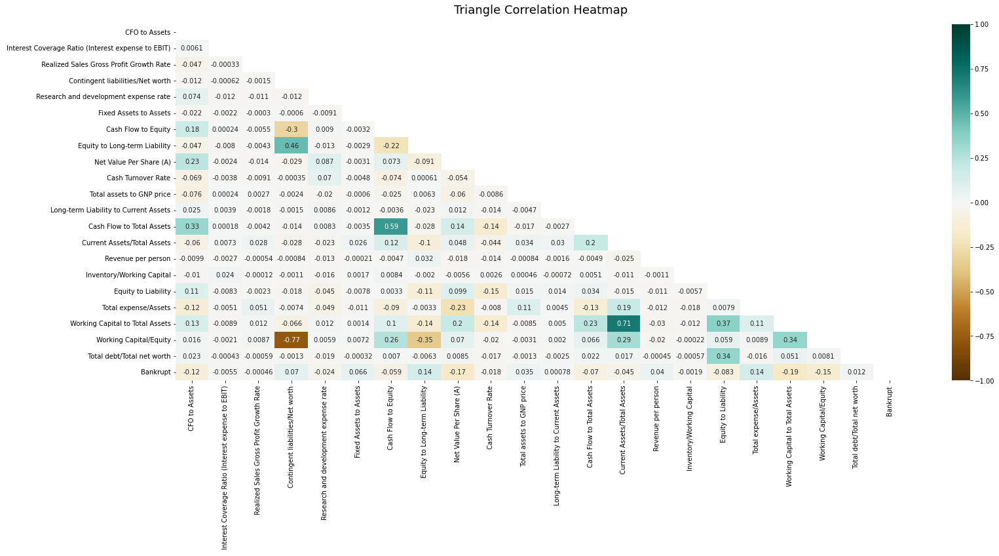

In [ ]:
plt.figure(figsize=(25, 10))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

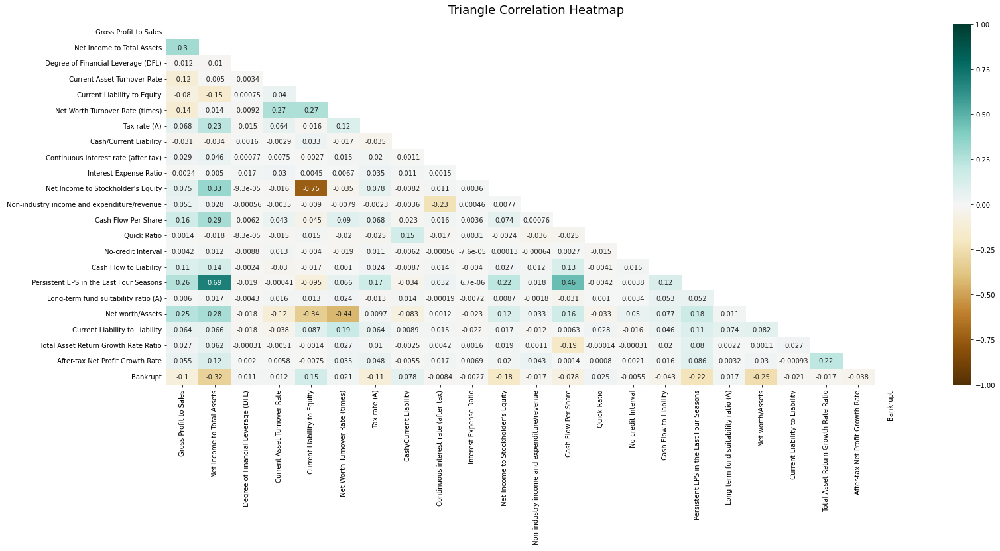

In [ ]:
plt.figure(figsize=(25, 10))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df2.corr(), dtype=bool))
heatmap = sns.heatmap(df2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

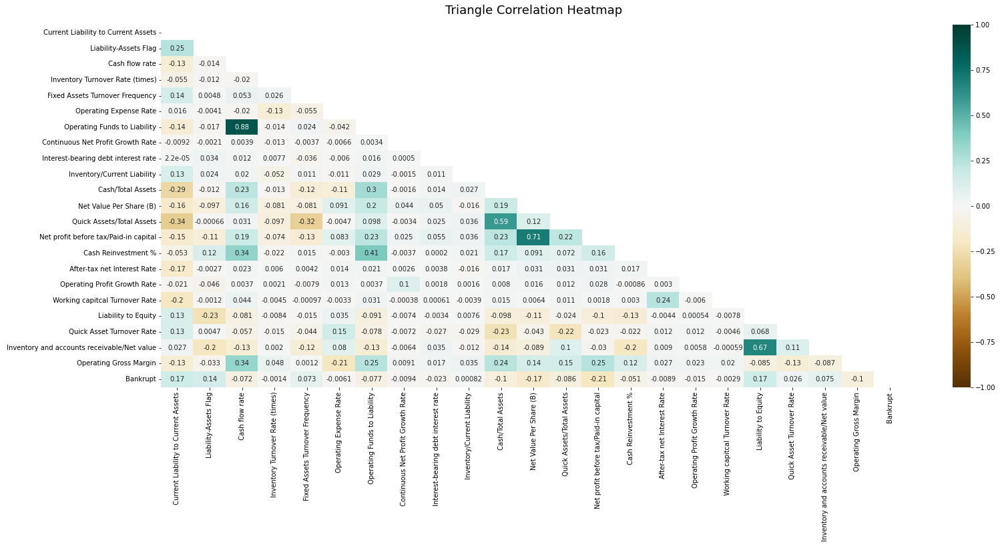

In [ ]:
plt.figure(figsize=(25, 10))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df3.corr(), dtype=bool))
heatmap = sns.heatmap(df3.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Based upon the correlation plots above:
*   Working Capital/Equity is highly correlated with Contingent liabilities/Net worth (remove the latter)
*   Working Capital to Total Assets is highly correlated with Current Assets/Total Assets (remove the latter)
*   Net Income to Stockholders Equity is highly correlated with Current Liability to Equity (remove the latter)
*   Operating Funds to Liability is highly correlated with Cash flow rate (remove the latter)
*   Net profit before tax/Paid-in capital is highly correlated to Net Value Per Share (B) (remove the latter)

In [ ]:
# copy the min-max dataframe
Xdf5 = origDF_minMax.copy()

In [ ]:
# remove columns
corrXdf5 = Xdf5.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate',
                        ' Current Liabilities/Liability', ' Current Liabilities/Equity',
                        ' Realized Sales Gross Margin', ' ROA(A) before interest and % after tax',
                        ' ROA(B) before interest and depreciation after tax',
                        ' Operating profit/Paid-in capital',' Operating Profit Per Share (Yuan ¥)',
                        ' Debt ratio %', ' Per Share Net profit before tax (Yuan ¥)',
                        ' ROA(C) before interest and depreciation before interest',
                        ' Retained Earnings to Total Assets', ' Pre-tax net Interest Rate',
                        ' Net Value Per Share (C)', ' Borrowing dependency',
                        ' Regular Net Profit Growth Rate',' Current Liability to Assets',
                        ' Contingent liabilities/Net worth', ' Current Assets/Total Assets',
                        ' Current Liability to Equity', ' Cash flow rate', ' Net Value Per Share (B)'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and the insignificant explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(corrXdf5.columns))

The original number of columns in the data is 96

After removing Bankrupt? and the insignificant explanatory variables,
  the number of columns in the reduced dataframe is 60


In [ ]:
columnNumbers = list(range(0, len(corrXdf5.columns)))

# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)

corrXdf5 = corrXdf5.iloc[:, columnNumbers]

columns1 = list(range(0, 30))
columns2 = list(range(30, 60))
#columns3 = list(range(43, 65))

columnNames = corrXdf5.columns

df1 = pd.DataFrame(index=corrXdf5.index, columns=columnNames[columns1])
df2 = pd.DataFrame(index=corrXdf5.index, columns=columnNames[columns2])
#df3 = pd.DataFrame(index=corrXdf5.index, columns=columnNames[columns3])

for aa in columns1:
  df1.iloc[:,aa] = corrXdf5.iloc[:,aa]
  print('aa is', aa) 
print('\n')

for aa in columns2:
  colIndex = aa-max(columns1) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df2.iloc[:, colIndex] = corrXdf5.iloc[:, aa]
print('\n')

#for aa in columns3:
#  colIndex = aa-max(columns2) - 1
#  print('aa is', aa, '; colIndex is', colIndex)
#  df3.iloc[:, colIndex] = corrXdf5.iloc[:, aa]
#print('\n')

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
#df3['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14
aa is 15
aa is 16
aa is 17
aa is 18
aa is 19
aa is 20
aa is 21
aa is 22
aa is 23
aa is 24
aa is 25
aa is 26
aa is 27
aa is 28
aa is 29


aa is 30 ; colIndex is 0
aa is 31 ; colIndex is 1
aa is 32 ; colIndex is 2
aa is 33 ; colIndex is 3
aa is 34 ; colIndex is 4
aa is 35 ; colIndex is 5
aa is 36 ; colIndex is 6
aa is 37 ; colIndex is 7
aa is 38 ; colIndex is 8
aa is 39 ; colIndex is 9
aa is 40 ; colIndex is 10
aa is 41 ; colIndex is 11
aa is 42 ; colIndex is 12
aa is 43 ; colIndex is 13
aa is 44 ; colIndex is 14
aa is 45 ; colIndex is 15
aa is 46 ; colIndex is 16
aa is 47 ; colIndex is 17
aa is 48 ; colIndex is 18
aa is 49 ; colIndex is 19
aa is 50 ; colIndex is 20
aa is 51 ; colIndex is 21
aa is 52 ; colIndex is 22
aa is 53 ; colIndex is 23
aa is 54 ; colIndex is 24
aa is 55 ; colIndex is 25
aa is 56 ; colIndex is 26
aa is 57 ; colIndex is 27
aa is 58 ; colIndex 

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

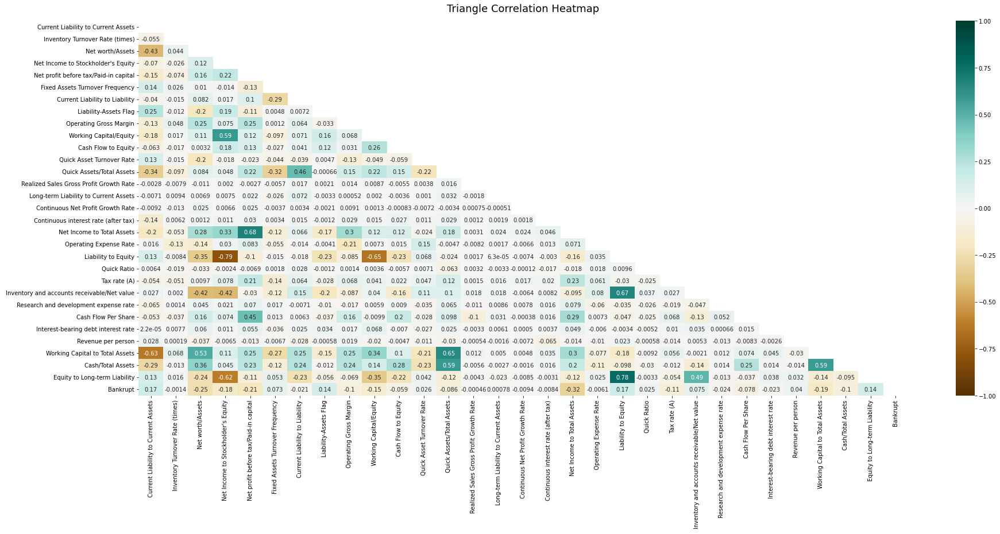

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

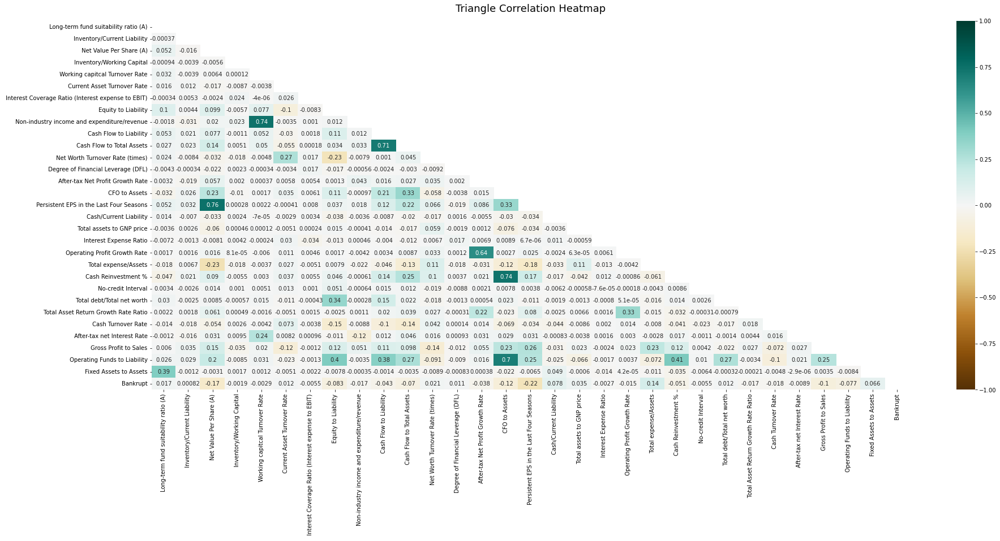

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df2.corr(), dtype=bool))
heatmap = sns.heatmap(df2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Based upon the correlation plots above:
*  After-tax net Interest Rate is highly correlated with Inventory/Current Liability (remove the latter)
*  Operating Profit Growth Rate is highly correlated with Persistent EPS in the Last Four Seasons (remove the latter)
*  Cash Reinvestment % is highly correlated with Liability to Equity and Net Income to Total Assets (remove the last two)
*  Tax Rate A is highly correlated to Revenue per person (remove the latter)

In [ ]:
# copy the min-max dataframe
Xdf6 = origDF_minMax.copy()

In [ ]:
# remove columns
corrXdf6 = Xdf6.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate',
                        ' Current Liabilities/Liability', ' Current Liabilities/Equity',
                        ' Realized Sales Gross Margin', ' ROA(A) before interest and % after tax',
                        ' ROA(B) before interest and depreciation after tax',
                        ' Operating profit/Paid-in capital',' Operating Profit Per Share (Yuan ¥)',
                        ' Debt ratio %', ' Per Share Net profit before tax (Yuan ¥)',
                        ' ROA(C) before interest and depreciation before interest',
                        ' Retained Earnings to Total Assets', ' Pre-tax net Interest Rate',
                        ' Net Value Per Share (C)', ' Borrowing dependency',
                        ' Regular Net Profit Growth Rate',' Current Liability to Assets',
                        ' Contingent liabilities/Net worth', ' Current Assets/Total Assets',
                        ' Current Liability to Equity', ' Cash flow rate', ' Net Value Per Share (B)',
                        ' Inventory/Current Liability',' Persistent EPS in the Last Four Seasons',
                        ' Liability to Equity',' Net Income to Total Assets',' Revenue per person'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and insignificant or correlated explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(corrXdf6.columns))

The original number of columns in the data is 96

After removing Bankrupt? and insignificant or correlated explanatory variables,
  the number of columns in the reduced dataframe is 55


In [ ]:
columnNumbers = list(range(0, len(corrXdf6.columns)))

# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)

corrXdf6 = corrXdf6.iloc[:, columnNumbers]

columns1 = list(range(0, 27))
columns2 = list(range(27, 55))

columnNames = corrXdf6.columns

df1 = pd.DataFrame(index=corrXdf6.index, columns=columnNames[columns1])
df2 = pd.DataFrame(index=corrXdf6.index, columns=columnNames[columns2])

for aa in columns1:
  df1.iloc[:,aa] = corrXdf6.iloc[:,aa]
  print('aa is', aa) 
print('\n')

for aa in columns2:
  colIndex = aa-max(columns1) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df2.iloc[:, colIndex] = corrXdf6.iloc[:, aa]
print('\n')

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14
aa is 15
aa is 16
aa is 17
aa is 18
aa is 19
aa is 20
aa is 21
aa is 22
aa is 23
aa is 24
aa is 25
aa is 26


aa is 27 ; colIndex is 0
aa is 28 ; colIndex is 1
aa is 29 ; colIndex is 2
aa is 30 ; colIndex is 3
aa is 31 ; colIndex is 4
aa is 32 ; colIndex is 5
aa is 33 ; colIndex is 6
aa is 34 ; colIndex is 7
aa is 35 ; colIndex is 8
aa is 36 ; colIndex is 9
aa is 37 ; colIndex is 10
aa is 38 ; colIndex is 11
aa is 39 ; colIndex is 12
aa is 40 ; colIndex is 13
aa is 41 ; colIndex is 14
aa is 42 ; colIndex is 15
aa is 43 ; colIndex is 16
aa is 44 ; colIndex is 17
aa is 45 ; colIndex is 18
aa is 46 ; colIndex is 19
aa is 47 ; colIndex is 20
aa is 48 ; colIndex is 21
aa is 49 ; colIndex is 22
aa is 50 ; colIndex is 23
aa is 51 ; colIndex is 24
aa is 52 ; colIndex is 25
aa is 53 ; colIndex is 26
aa is 54 ; colIndex is 27




Text(0.5, 1.0, 'Triangle Correlation Heatmap')

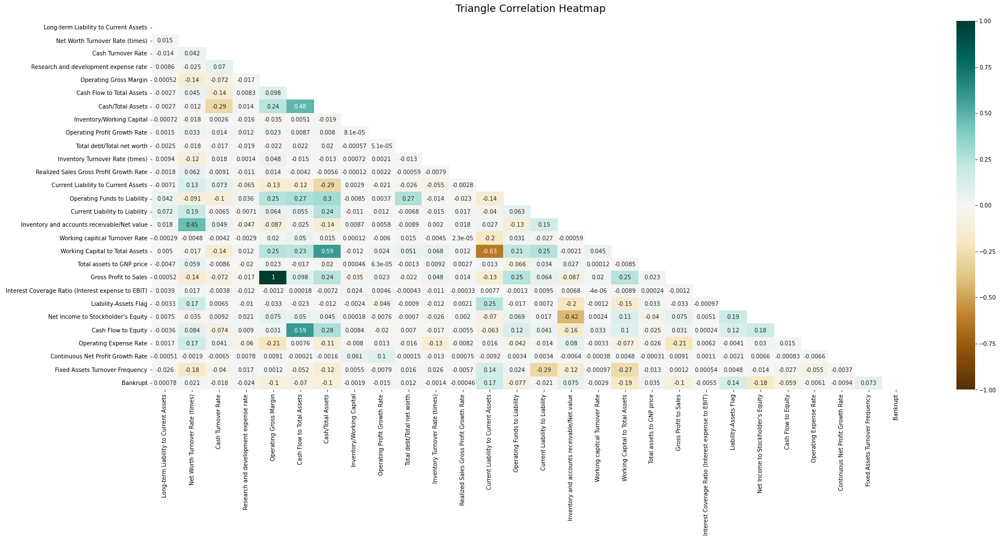

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

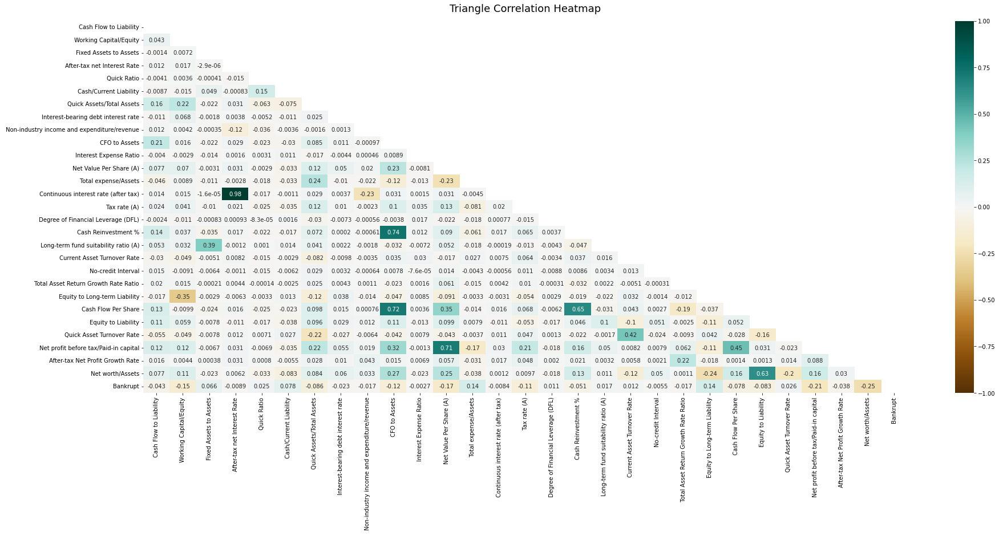

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df2.corr(), dtype=bool))
heatmap = sns.heatmap(df2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Based upon the correlation plots above:
*   Gross Profit to Sales is 100% correlated with Operating Gross Margin (remove the latter)
*   Continuous interest rate (after tax) is highly correlated with After-tax Net Interest Rate (remove the former)
*   CFO to Assets is correlated with Cash Flow Per Share and Cash Reinvestment %(remove the last two)

From a previous analysis (not shown here) ...
*   Working Capital to Total Assets is correlated with Current Liability to Current Assets and Quick Assets/Total Assets (remove the last two)
*   Equity to Liability is correlated with Net worth/Assets (remove the former)
*   Net Income to Stockholders Equity is correlated with Equity to Long-term Liability (remove the latter)
*   Non-industry income and expenditure/revenue is correlated with Working capitcal Turnover Rate (remove the latter)


In [ ]:
# copy the min-max dataframe
Xdf7 = origDF_minMax.copy()

In [ ]:
# remove columns
corrXdf7 = Xdf7.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate',
                        ' Current Liabilities/Liability', ' Current Liabilities/Equity',
                        ' Realized Sales Gross Margin', ' ROA(A) before interest and % after tax',
                        ' ROA(B) before interest and depreciation after tax',
                        ' Operating profit/Paid-in capital',' Operating Profit Per Share (Yuan ¥)',
                        ' Debt ratio %', ' Per Share Net profit before tax (Yuan ¥)',
                        ' ROA(C) before interest and depreciation before interest',
                        ' Retained Earnings to Total Assets', ' Pre-tax net Interest Rate',
                        ' Net Value Per Share (C)', ' Borrowing dependency',
                        ' Regular Net Profit Growth Rate',' Current Liability to Assets',
                        ' Contingent liabilities/Net worth', ' Current Assets/Total Assets',
                        ' Current Liability to Equity', ' Cash flow rate', ' Net Value Per Share (B)',
                        ' Inventory/Current Liability',' Persistent EPS in the Last Four Seasons',
                        ' Liability to Equity',' Net Income to Total Assets',' Revenue per person',
                        ' Operating Gross Margin',' Continuous interest rate (after tax)',
                        ' Cash Flow Per Share',' Cash Reinvestment %',
                        ' Current Liability to Current Assets', ' Quick Assets/Total Assets',
                        ' Equity to Liability',' Equity to Long-term Liability',
                        ' Working capitcal Turnover Rate'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and insignificant or correlated explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(corrXdf7.columns))         # NOTE Xdf VERSION

The original number of columns in the data is 96

After removing Bankrupt? and insignificant or correlated explanatory variables,
  the number of columns in the reduced dataframe is 46


In [ ]:
columnNumbers = list(range(0, len(corrXdf7.columns)))            # NOTE Xdf VERSION

# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)

corrXdf7 = corrXdf7.iloc[:, columnNumbers]         # NOTE Xdf VERSION

columns1 = list(range(0, 23))
columns2 = list(range(23, 46))

columnNames = corrXdf7.columns  # NOTE Xdf VERSION

df1 = pd.DataFrame(index=corrXdf7.index, columns=columnNames[columns1])      # NOTE Xdf VERSION
df2 = pd.DataFrame(index=corrXdf7.index, columns=columnNames[columns2])      # NOTE Xdf VERSION

for aa in columns1:
  df1.iloc[:,aa] = corrXdf7.iloc[:,aa]                # NOTE Xdf VERSION
  print('aa is', aa) 
print('\n')

for aa in columns2:
  colIndex = aa-max(columns1) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df2.iloc[:, colIndex] = corrXdf7.iloc[:, aa]         # NOTE Xdf VERSION

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14
aa is 15
aa is 16
aa is 17
aa is 18
aa is 19
aa is 20
aa is 21
aa is 22


aa is 23 ; colIndex is 0
aa is 24 ; colIndex is 1
aa is 25 ; colIndex is 2
aa is 26 ; colIndex is 3
aa is 27 ; colIndex is 4
aa is 28 ; colIndex is 5
aa is 29 ; colIndex is 6
aa is 30 ; colIndex is 7
aa is 31 ; colIndex is 8
aa is 32 ; colIndex is 9
aa is 33 ; colIndex is 10
aa is 34 ; colIndex is 11
aa is 35 ; colIndex is 12
aa is 36 ; colIndex is 13
aa is 37 ; colIndex is 14
aa is 38 ; colIndex is 15
aa is 39 ; colIndex is 16
aa is 40 ; colIndex is 17
aa is 41 ; colIndex is 18
aa is 42 ; colIndex is 19
aa is 43 ; colIndex is 20
aa is 44 ; colIndex is 21
aa is 45 ; colIndex is 22




Text(0.5, 1.0, 'Triangle Correlation Heatmap')

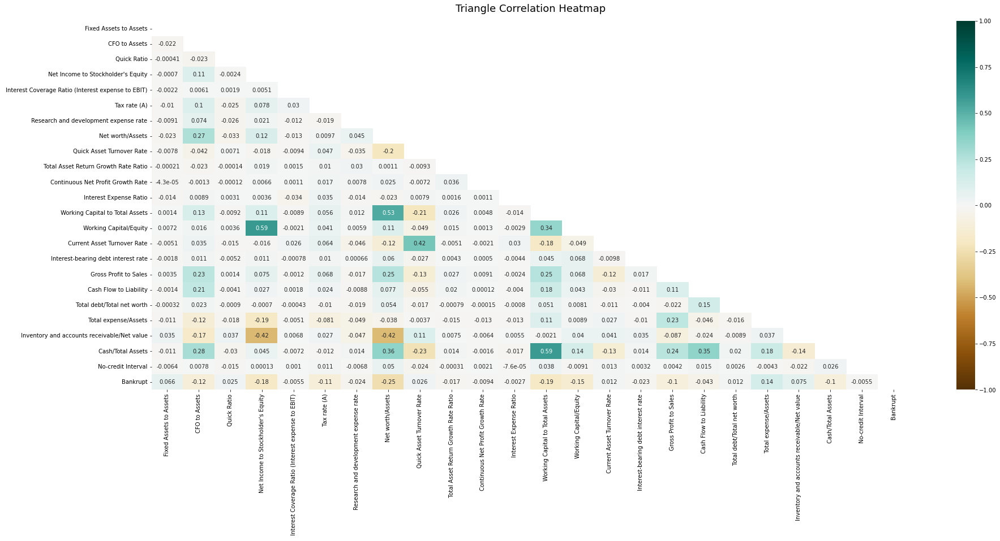

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

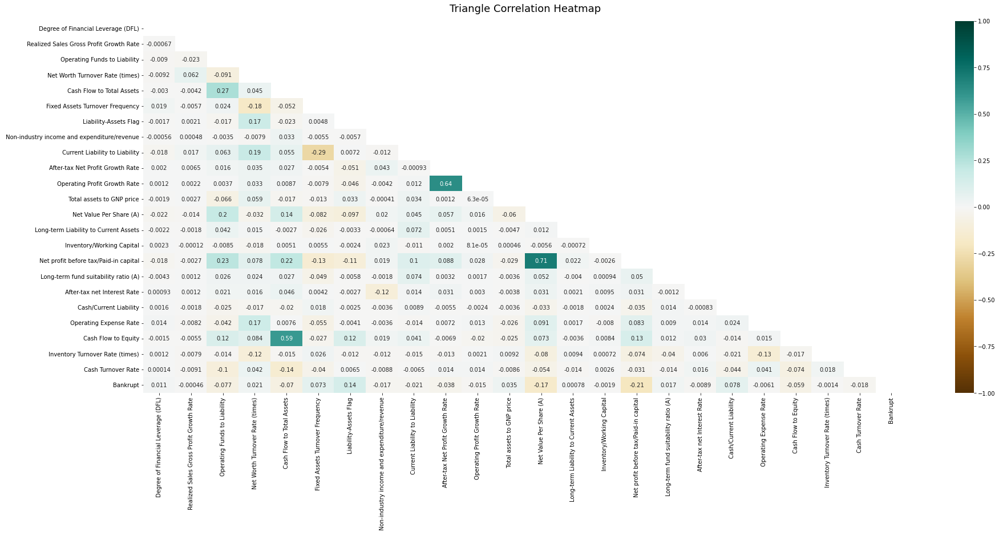

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df2.corr(), dtype=bool))
heatmap = sns.heatmap(df2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Based upon the correlation plots above:
*   Working Capital/Equity is correlated with Net Income to Stockholder's Equity (remove the latter)
*   Operating Profit Growth Rate is correlated with After-tax Net Profit Growth Rate (remove the former)
*   Cash/Total Assets is correlated with Working Capital to Total Assets (remove the former)


*   Net profit before tax/Paid-in capital is correlated with Net Value Per Share (A) (remove the latter)
*   Cash Flow to Equity is correlated with Cash Flow to Total Assets (remove the former)
*   Operating Profit Growth Rate is correlated with After-tax Net Profit Growth Rate (remove the former)

In [ ]:
# copy the min-max dataframe
Xdf8 = origDF_minMax.copy()

In [ ]:
# remove columns
corrXdf8 = Xdf8.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate',
                        ' Current Liabilities/Liability', ' Current Liabilities/Equity',
                        ' Realized Sales Gross Margin', ' ROA(A) before interest and % after tax',
                        ' ROA(B) before interest and depreciation after tax',
                        ' Operating profit/Paid-in capital',' Operating Profit Per Share (Yuan ¥)',
                        ' Debt ratio %', ' Per Share Net profit before tax (Yuan ¥)',
                        ' ROA(C) before interest and depreciation before interest',
                        ' Retained Earnings to Total Assets', ' Pre-tax net Interest Rate',
                        ' Net Value Per Share (C)', ' Borrowing dependency',
                        ' Regular Net Profit Growth Rate',' Current Liability to Assets',
                        ' Contingent liabilities/Net worth', ' Current Assets/Total Assets',
                        ' Current Liability to Equity', ' Cash flow rate', ' Net Value Per Share (B)',
                        ' Inventory/Current Liability',' Persistent EPS in the Last Four Seasons',
                        ' Liability to Equity',' Net Income to Total Assets',' Revenue per person',
                        ' Operating Gross Margin',' Continuous interest rate (after tax)',
                        ' Cash Flow Per Share',' Cash Reinvestment %',
                        ' Current Liability to Current Assets', ' Quick Assets/Total Assets',
                        ' Equity to Liability',' Equity to Long-term Liability',
                        ' Working capitcal Turnover Rate'," Net Income to Stockholder's Equity",
                        ' Operating Profit Growth Rate',' Cash/Total Assets',
                        ' Net Value Per Share (A)',' Cash Flow to Equity',' Operating Profit Growth Rate'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and insignificant or correlated explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(corrXdf8.columns))         # NOTE Xdf VERSION

The original number of columns in the data is 96

After removing Bankrupt? and insignificant or correlated explanatory variables,
  the number of columns in the reduced dataframe is 41


In [ ]:
columnNumbers = list(range(0, len(corrXdf8.columns)))            # NOTE Xdf VERSION

# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)
random.shuffle(columnNumbers)

corrXdf7 = corrXdf8.iloc[:, columnNumbers]         # NOTE Xdf VERSION

columns1 = list(range(0, 20))
columns2 = list(range(20, 41))

columnNames = corrXdf8.columns  # NOTE Xdf VERSION

df1 = pd.DataFrame(index=corrXdf8.index, columns=columnNames[columns1])      # NOTE Xdf VERSION
df2 = pd.DataFrame(index=corrXdf8.index, columns=columnNames[columns2])      # NOTE Xdf VERSION

for aa in columns1:
  df1.iloc[:,aa] = corrXdf8.iloc[:,aa]                # NOTE Xdf VERSION
  print('aa is', aa) 
print('\n')

for aa in columns2:
  colIndex = aa-max(columns1) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df2.iloc[:, colIndex] = corrXdf8.iloc[:, aa]         # NOTE Xdf VERSION

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14
aa is 15
aa is 16
aa is 17
aa is 18
aa is 19


aa is 20 ; colIndex is 0
aa is 21 ; colIndex is 1
aa is 22 ; colIndex is 2
aa is 23 ; colIndex is 3
aa is 24 ; colIndex is 4
aa is 25 ; colIndex is 5
aa is 26 ; colIndex is 6
aa is 27 ; colIndex is 7
aa is 28 ; colIndex is 8
aa is 29 ; colIndex is 9
aa is 30 ; colIndex is 10
aa is 31 ; colIndex is 11
aa is 32 ; colIndex is 12
aa is 33 ; colIndex is 13
aa is 34 ; colIndex is 14
aa is 35 ; colIndex is 15
aa is 36 ; colIndex is 16
aa is 37 ; colIndex is 17
aa is 38 ; colIndex is 18
aa is 39 ; colIndex is 19
aa is 40 ; colIndex is 20


Text(0.5, 1.0, 'Triangle Correlation Heatmap')

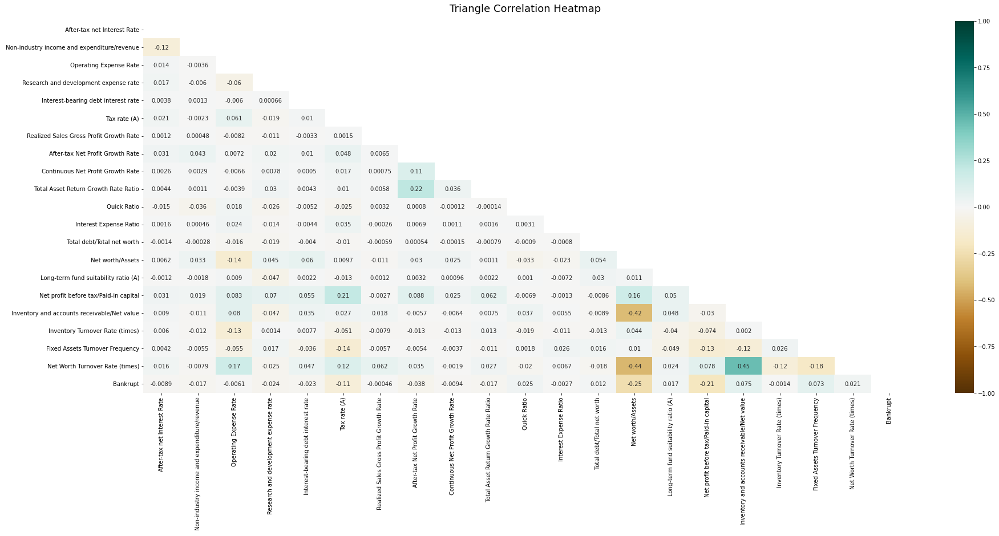

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

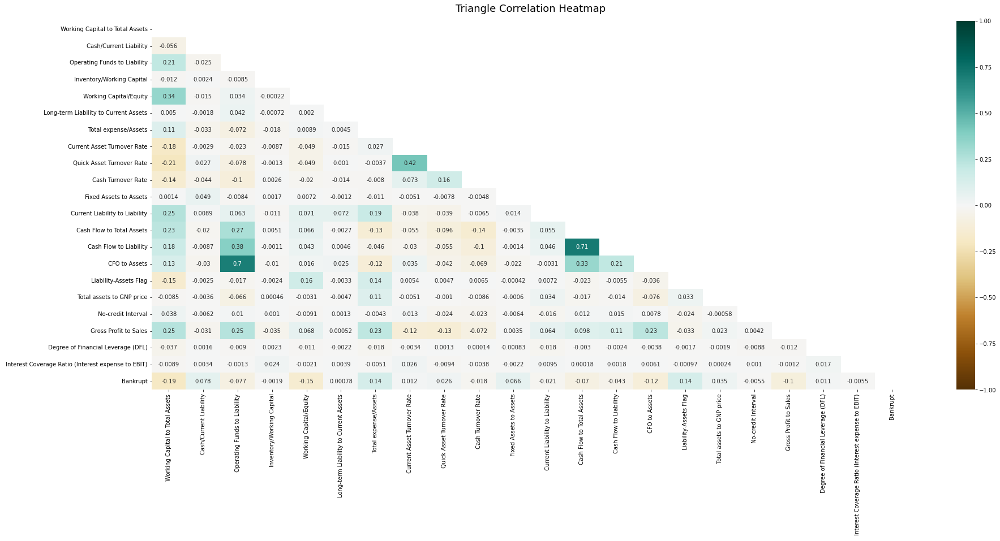

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df2.corr(), dtype=bool))
heatmap = sns.heatmap(df2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Based upon the correlation plots above:
*   CFO to Assets is correlated with Operating Funds to Liability (remove the latter)
*   Cash Flow to Liability is correlated with Cash Flow to Total Assets (remove the former)

In [ ]:
# copy the min-max dataframe
Xdf9 = origDF_minMax.copy()

In [ ]:
# remove columns
corrXdf9 = Xdf9.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate',
                        ' Current Liabilities/Liability', ' Current Liabilities/Equity',
                        ' Realized Sales Gross Margin', ' ROA(A) before interest and % after tax',
                        ' ROA(B) before interest and depreciation after tax',
                        ' Operating profit/Paid-in capital',' Operating Profit Per Share (Yuan ¥)',
                        ' Debt ratio %', ' Per Share Net profit before tax (Yuan ¥)',
                        ' ROA(C) before interest and depreciation before interest',
                        ' Retained Earnings to Total Assets', ' Pre-tax net Interest Rate',
                        ' Net Value Per Share (C)', ' Borrowing dependency',
                        ' Regular Net Profit Growth Rate',' Current Liability to Assets',
                        ' Contingent liabilities/Net worth', ' Current Assets/Total Assets',
                        ' Current Liability to Equity', ' Cash flow rate', ' Net Value Per Share (B)',
                        ' Inventory/Current Liability',' Persistent EPS in the Last Four Seasons',
                        ' Liability to Equity',' Net Income to Total Assets',' Revenue per person',
                        ' Operating Gross Margin',' Continuous interest rate (after tax)',
                        ' Cash Flow Per Share',' Cash Reinvestment %',
                        ' Current Liability to Current Assets', ' Quick Assets/Total Assets',
                        ' Equity to Liability',' Equity to Long-term Liability',
                        ' Working capitcal Turnover Rate'," Net Income to Stockholder's Equity",
                        ' Operating Profit Growth Rate',' Cash/Total Assets',
                        ' Net Value Per Share (A)',' Cash Flow to Equity',' Operating Profit Growth Rate',
                        ' Operating Funds to Liability', ' Cash Flow to Liability'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and insignificant or correlated explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(corrXdf9.columns))         # NOTE Xdf VERSION

The original number of columns in the data is 96

After removing Bankrupt? and insignificant or correlated explanatory variables,
  the number of columns in the reduced dataframe is 39


In [ ]:
columnNumbers = list(range(0, len(corrXdf9.columns)))            # NOTE Xdf VERSION

# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)

corrXdf9 = corrXdf9.iloc[:, columnNumbers]         # NOTE (2X) Xdf VERSION 

columns1 = list(range(0, 19))
columns2 = list(range(19, 39))

columnNames = corrXdf9.columns  # NOTE Xdf VERSION

df1 = pd.DataFrame(index=corrXdf9.index, columns=columnNames[columns1])      # NOTE Xdf VERSION
df2 = pd.DataFrame(index=corrXdf9.index, columns=columnNames[columns2])      # NOTE Xdf VERSION

for aa in columns1:
  df1.iloc[:,aa] = corrXdf9.iloc[:,aa]                # NOTE Xdf VERSION
  print('aa is', aa) 
print('\n')

for aa in columns2:
  colIndex = aa-max(columns1) - 1
  print('aa is', aa, '; colIndex is', colIndex)
  df2.iloc[:, colIndex] = corrXdf9.iloc[:, aa]         # NOTE Xdf VERSION

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14
aa is 15
aa is 16
aa is 17
aa is 18


aa is 19 ; colIndex is 0
aa is 20 ; colIndex is 1
aa is 21 ; colIndex is 2
aa is 22 ; colIndex is 3
aa is 23 ; colIndex is 4
aa is 24 ; colIndex is 5
aa is 25 ; colIndex is 6
aa is 26 ; colIndex is 7
aa is 27 ; colIndex is 8
aa is 28 ; colIndex is 9
aa is 29 ; colIndex is 10
aa is 30 ; colIndex is 11
aa is 31 ; colIndex is 12
aa is 32 ; colIndex is 13
aa is 33 ; colIndex is 14
aa is 34 ; colIndex is 15
aa is 35 ; colIndex is 16
aa is 36 ; colIndex is 17
aa is 37 ; colIndex is 18
aa is 38 ; colIndex is 19


Text(0.5, 1.0, 'Triangle Correlation Heatmap')

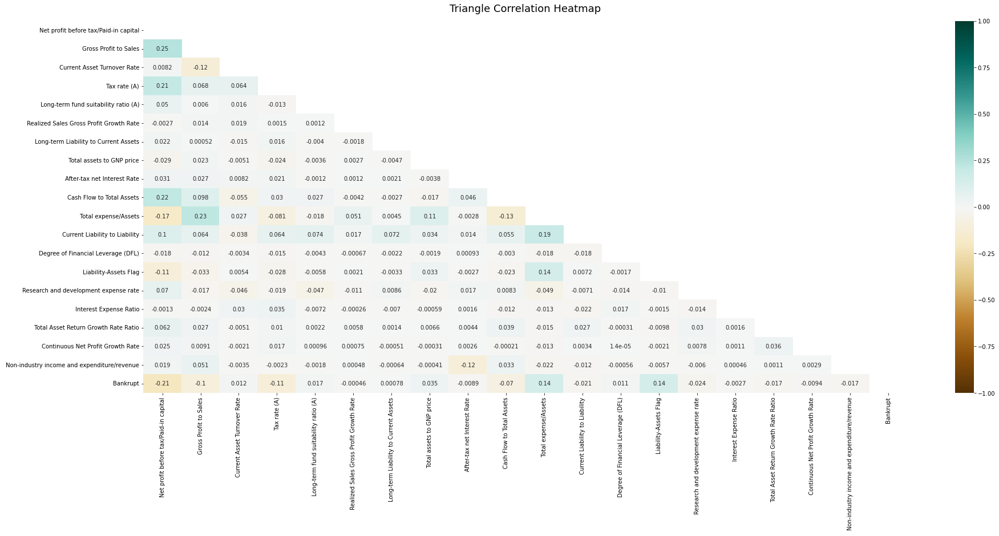

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

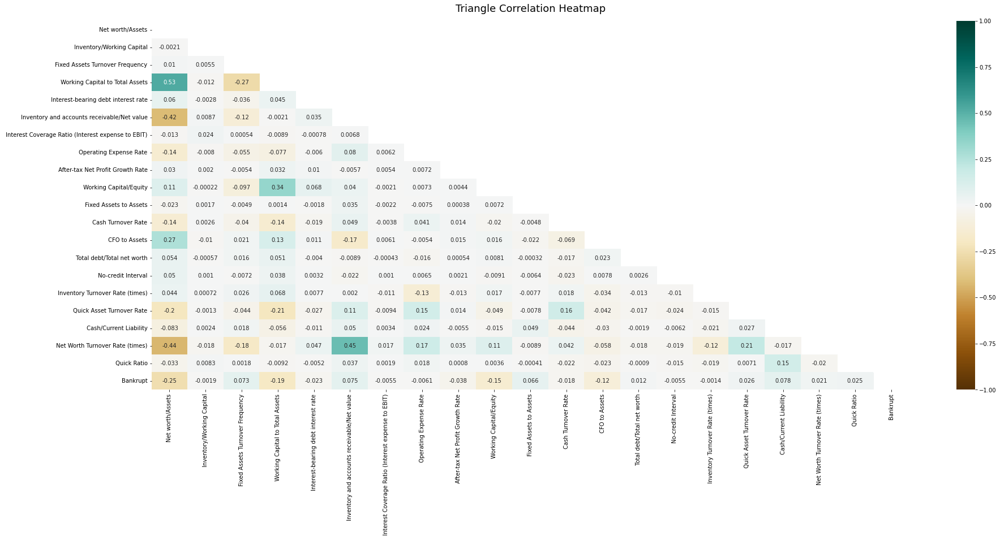

In [ ]:
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df2.corr(), dtype=bool))
heatmap = sns.heatmap(df2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

In [ ]:
# copy the min-max dataframe
corrXdf10 = corrXdf9.copy()

In [ ]:
# randomize the column numbers and the columns in corrXdf
random.shuffle(columnNumbers)

corrXdf10 = corrXdf10.iloc[:, columnNumbers]         # NOTE (2X) Xdf VERSION 

columns1 = list(range(0, 39))

columnNames = corrXdf10.columns  # NOTE Xdf VERSION

df1 = pd.DataFrame(index=corrXdf10.index, columns=columnNames[columns1])      # NOTE Xdf VERSION

for aa in columns1:
  df1.iloc[:,aa] = corrXdf10.iloc[:,aa]                # NOTE Xdf VERSION
  print('aa is', aa) 
print('\n')

#for aa in columns2:
#  colIndex = aa-max(columns1) - 1
#  print('aa is', aa, '; colIndex is', colIndex)
#  df2.iloc[:, colIndex] = corrXdf9.iloc[:, aa]         # NOTE Xdf VERSION

# add the response variable to the dataframes
df1['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)
#df2['Bankrupt'] = origDF_minMax.loc[:, 'Bankrupt?'].astype(int)

aa is 0
aa is 1
aa is 2
aa is 3
aa is 4
aa is 5
aa is 6
aa is 7
aa is 8
aa is 9
aa is 10
aa is 11
aa is 12
aa is 13
aa is 14
aa is 15
aa is 16
aa is 17
aa is 18
aa is 19
aa is 20
aa is 21
aa is 22
aa is 23
aa is 24
aa is 25
aa is 26
aa is 27
aa is 28
aa is 29
aa is 30
aa is 31
aa is 32
aa is 33
aa is 34
aa is 35
aa is 36
aa is 37
aa is 38




Text(0.5, 1.0, 'Triangle Correlation Heatmap')

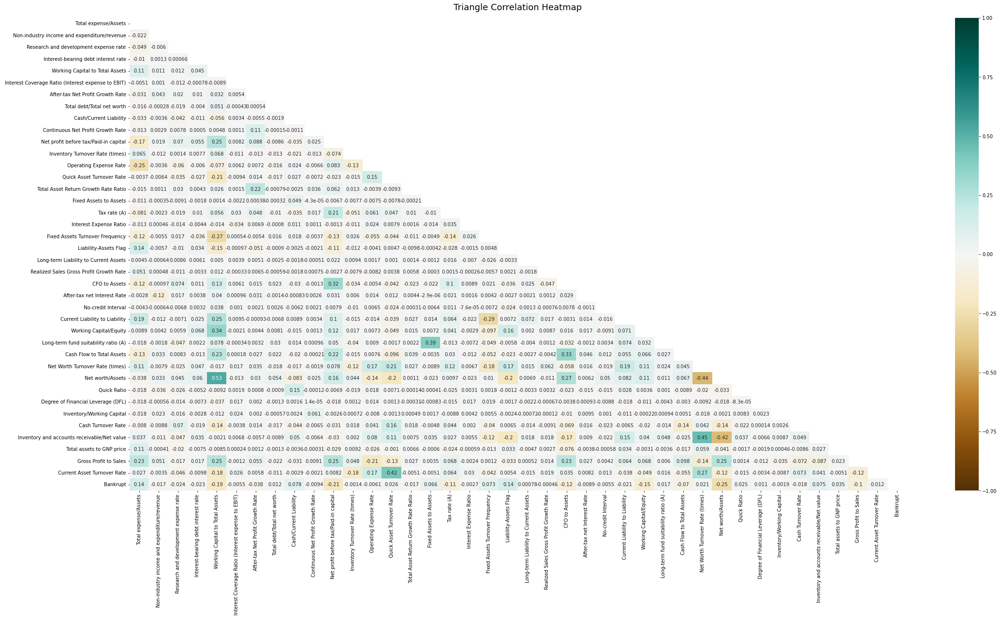

In [ ]:
plt.figure(figsize=(36, 18))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df1.corr(), dtype=bool))
heatmap = sns.heatmap(df1.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

Now that most correlations between variables have been removed, remove explanatory variables with very small (e.g., 0.00XX) correlations with the response variable 'Bankrupt?'

These are:
*   Interest Coverage Ratio (Interest expense to EBIT)
*   Continuous Net Profit Growth Rate
*   Inventory Turnover Rate (times)
*   Operating Expense Rate
*   Interest Expense Ratio
*   Long-term Liability to Current Assets
*   Realized Sales Gross Profit Growth Rate
*   After-tax net Interest Rate
*   No-credit Interval
*   Inventory/Working Capital

**============================================================================================**

**Start here after performing min-max normalization ...**

In [ ]:
# copy the min-max dataframe
Xdf_forSVC = origDF_minMax.copy()

In [ ]:
# remove columns
Xdf_forSVC_reduced = Xdf_forSVC.drop(columns=['Bankrupt?', ' Net Income Flag', ' Quick Assets/Current Liability',
                        ' Revenue Per Share (Yuan ¥)', ' Current Ratio',
                        ' Cash Flow to Sales', ' Total income/Total expense',
                        ' Total Asset Turnover', ' Operating Profit Rate',
                        ' Operating profit per person', ' Accounts Receivable Turnover',
                        ' Total Asset Growth Rate', ' Allocation rate per person',
                        ' Average Collection Days', ' Net Value Growth Rate',
                        ' Current Liabilities/Liability', ' Current Liabilities/Equity',
                        ' Realized Sales Gross Margin', ' ROA(A) before interest and % after tax',
                        ' ROA(B) before interest and depreciation after tax',
                        ' Operating profit/Paid-in capital',' Operating Profit Per Share (Yuan ¥)',
                        ' Debt ratio %', ' Per Share Net profit before tax (Yuan ¥)',
                        ' ROA(C) before interest and depreciation before interest',
                        ' Retained Earnings to Total Assets', ' Pre-tax net Interest Rate',
                        ' Net Value Per Share (C)', ' Borrowing dependency',
                        ' Regular Net Profit Growth Rate',' Current Liability to Assets',
                        ' Contingent liabilities/Net worth', ' Current Assets/Total Assets',
                        ' Current Liability to Equity', ' Cash flow rate', ' Net Value Per Share (B)',
                        ' Inventory/Current Liability',' Persistent EPS in the Last Four Seasons',
                        ' Liability to Equity',' Net Income to Total Assets',' Revenue per person',
                        ' Operating Gross Margin',' Continuous interest rate (after tax)',
                        ' Cash Flow Per Share',' Cash Reinvestment %',
                        ' Current Liability to Current Assets', ' Quick Assets/Total Assets',
                        ' Equity to Liability',' Equity to Long-term Liability',
                        ' Working capitcal Turnover Rate'," Net Income to Stockholder's Equity",
                        ' Operating Profit Growth Rate',' Cash/Total Assets',
                        ' Net Value Per Share (A)',' Cash Flow to Equity',' Operating Profit Growth Rate',
                        ' Operating Funds to Liability', ' Cash Flow to Liability',
                        ' Interest Coverage Ratio (Interest expense to EBIT)',
                        ' Continuous Net Profit Growth Rate',' Inventory Turnover Rate (times)',
                        ' Operating Expense Rate',' Interest Expense Ratio',
                        ' Long-term Liability to Current Assets',
                        ' Realized Sales Gross Profit Growth Rate',' After-tax net Interest Rate',
                        ' No-credit Interval',' Inventory/Working Capital'], axis=1)

print('The original number of columns in the data is', len(origDF.columns))
print('\nAfter removing Bankrupt? and insignificant or correlated explanatory variables,')
print('  the number of columns in the reduced dataframe is', len(Xdf_forSVC_reduced.columns))         # NOTE Xdf VERSION

The original number of columns in the data is 96

After removing Bankrupt? and insignificant or correlated explanatory variables,
  the number of columns in the reduced dataframe is 29


**Create/perform Support Vector Machine and generate Performance Metrics**

In [ ]:
# split into training and validation datasets
y = origDF_minMax['Bankrupt?']
X = Xdf_forSVC_reduced
trainDF, valDF, yTrain, yVal = train_test_split(X, y, test_size = 0.2, random_state = 42)

**Confusion matrices**

In [ ]:
# perform svm using SGDCClassifier 'hinge'
svc_model = SGDClassifier(loss='hinge', alpha=0.0001)
svc_model.fit(trainDF, yTrain)

# calculate predictions for training and validation sets
yTrainPred = svc_model.predict(trainDF)
yValPred = svc_model.predict(valDF)

trainCM = metrics.confusion_matrix(yTrain, yTrainPred)
valCM = metrics.confusion_matrix(yVal, yValPred)
print('The training data confusion matrix is:\n',trainCM)
print('\nThe validation data confusion matrix is:\n',valCM)

The training data confusion matrix is:
 [[5284    2]
 [ 162    7]]

The validation data confusion matrix is:
 [[1313    0]
 [  49    2]]

Training data precision score = 0.7777777777777778
Validation data precision score = 1.0

Training data f1 score = 0.07865168539325842
Validation data f1 score = 0.07547169811320754


**Performance metrics**

In [ ]:
# True Positive Rate / "Sensitivity" / "Recall"
trainTPR = trainCM[0][0]/(trainCM[0][0] + trainCM[1][0])
valTPR = valCM[0][0]/(valCM[0][0] + trainCM[1][0])

# False Negative Rate
trainFNR = trainCM[1][0]/(trainCM[0][0] + trainCM[1][0])
valFNR = valCM[1][0]/(valCM[0][0] + trainCM[1][0])

# True Negative Rate / "Specificity"
trainTNR = trainCM[1][1]/(trainCM[1][1] + trainCM[0][1])
valTNR = valCM[1][1]/(valCM[1][1] + valCM[0][1])

# False Positive Rate = (1-Specificity)
trainFPR = trainCM[0][1]/(trainCM[1][1] + trainCM[0][1])
valFPR = valCM[0][1]/(valCM[1][1] + valCM[0][1])

# Precision
trainPrecision = trainCM[0][0]/(trainCM[0][0] + trainCM[0][1])
valPrecision = valCM[0][0]/(valCM[0][0] + valCM[0][1])

# Accuracy
trainAccuracy = (trainCM[0][0] + trainCM[1][1]) / (trainCM[0][0]+trainCM[0][1]+trainCM[1][0]+trainCM[1][1])
valAccuracy = (valCM[0][0] + valCM[1][1]) / (valCM[0][0]+valCM[0][1]+valCM[1][0]+valCM[1][1])

print('Based upon calculations using the confusion matrix elements:')
print('\nTraining data TPR/Sensitivity/Recall =', trainTPR)
print('Validation data TPR/Sensitivity/Recall =', valTPR)
print('\nTraining data FNR =', trainFNR)
print('Validation data FNR =', valFNR)
print('\nTraining data TNR/Specificity =', trainTNR)
print('Validation data TNR/Specificity =', valTNR)
print('\nTraining data FPR (1-Specificity) =', trainFPR)
print('Validation data FPR (1-Specificity) =', valFPR)
print('\nTraining data Precision =', trainPrecision)
print('  For comparison, training data precision using metrics.precision_score =',metrics.precision_score(yTrain, yTrainPred))
print('\nValidation data Precision =', valPrecision)
print('  For comparison, validation data precision using metrics.precision_score =',metrics.precision_score(yVal, yValPred))


print('\nTraining data f1 score =', metrics.f1_score(yTrain, yTrainPred))
print('Validation data f1 score =', metrics.f1_score(yVal, yValPred))

Based upon calculations using the confusion matrix elements:

Training data TPR/Sensitivity/Recall = 0.9702533969886155
Validation data TPR/Sensitivity/Recall = 0.8901694915254237

Training data FNR = 0.0297466030113845
Validation data FNR = 0.033220338983050844

Training data TNR/Specificity = 0.7777777777777778
Validation data TNR/Specificity = 1.0

Training data FPR (1-Specificity) = 0.2222222222222222
Validation data FPR (1-Specificity) = 0.0

Training data Precision = 0.9996216420734014
  For comparison, training data precision using metrics.precision_score = 0.7777777777777778

Validation data Precision = 1.0
  For comparison, validation data precision using metrics.precision_score = 1.0

Training data f1 score = 0.07865168539325842
Validation data f1 score = 0.07547169811320754


**Generate ROC curves**

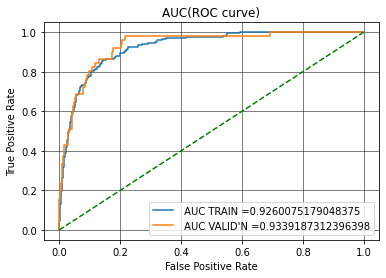

In [ ]:
# for the ROC curve, the following code uses a decision function and was adapted from code at:
#   https://datascience.stackexchange.com/questions/69442/plotting-roc-auc-for-svm-algorithm

yTrain_actualPred = svc_model.decision_function(trainDF)
yVal_actualPred = svc_model.decision_function(valDF)

train_fpr, train_tpr, train_thresholds = roc_curve(yTrain, yTrain_actualPred)
val_fpr, val_tpr, val_thresholds = roc_curve(yVal, yVal_actualPred)

plt.grid()

plt.plot(train_fpr, train_tpr, label=" AUC TRAIN ="+str(auc(train_fpr, train_tpr)))
plt.plot(val_fpr, val_tpr, label=" AUC VALID'N ="+str(auc(val_fpr, val_tpr)))
plt.plot([0,1],[0,1],'g--')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC(ROC curve)")
plt.grid(color='black', linestyle='-', linewidth=0.5)
plt.show()

**Precision/Recall curves**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


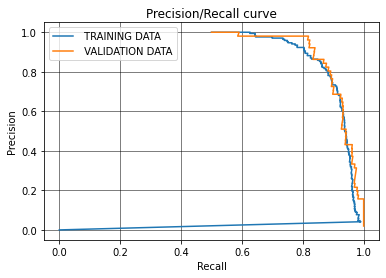

In [ ]:
# Recall=TPR and Precision=TPR/(TPR+FPR)
trainPrecisionData = train_tpr/(train_tpr + train_fpr)
valPrecisionData = val_tpr/(val_tpr + val_fpr)

plt.grid()

plt.plot(trainPrecisionData, train_tpr, label=" TRAINING DATA")
plt.plot(valPrecisionData, val_tpr, label=" VALIDATION DATA")
plt.legend()
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision/Recall curve")
plt.grid(color='black', linestyle='-', linewidth=0.5)
plt.show()

# SUMMARY / REFLECTION

In this assignment, Naive Bayes, Logistic Regression and Support Vector Machines were explored with respect to modeling as well as binary classification and prediction.  Various metrics were used to assess model performance, such as binary confusion matrices, the TP, FP, FN and TN quadrants, ROC/AUC and Recall/Precision Curves, and others. 

In addition to traditional procedures such as evaluation of boxplots and correlation heatmaps, Naive Bayes and Logistic Regression were essentially used as part of the Exploratory Data Analysis (EDA) portion of this study to condense the  number of explanatory variables prior to using Support Vector Machines. With the exception of one variable that was immediately eliminated by inspection of its constant value, the remaining variables were randomly-ordered and a sliding window was used to grab subsets of these variables. For each windowed subset, a Naive Bayes or Logistic Regression model was created and the prediction accuracy score of the model was obtained. After accuracy score was obtained for one subset of explanatory variables, the window shifted to the next subset of variables and the process was repeated. After all explanatory variables had been tested in subsets, the variables were randomly-reordered again and the window-shift procedure was repeated.  This procedure of randomly-ordering the variables and testing all of them them in subsets was repeated multiple (several hundred to several thousand) times.  After these multiple iterations, the average accuracy score of each variable was calculated and plotted, and variables exhibiting relatively low scores were eliminated from the dataset.  This overall approach was performed multiple times until there did not appear to be any more "weak" explanatory variables using this approach.

As a result of the procedures used during EDA, the number of explanatory variables was reduced from 95 to 29.

After EDA, a Support Vector Machine method (SGDClassifier, loss='hinge') was explored.  The default value for hyperparameter alpha (alpha=0.0001) appeared to give good results.  It is possible further evaluations with other types of SVMs could improve the SVM results shown in this notebook.